In [1]:
import sys
sys.path.insert(0, '../../stock_factor_lab/')

# 美股實驗彙總

## 回測期間設定

In [2]:
START_DATE = '2003-3-31'
END_DATE = '2024-12-31'

## 前置作業

### import

In [3]:
import talib
from get_data import Data
import backtest
from combinations import sim_conditions
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
# import plotly.graph_objs as go
import plotly.express as px
from itertools import cycle
from plotly.subplots import make_subplots
from matplotlib import rcParams
rcParams['font.sans-serif'] = ['Microsoft JhengHei']
# plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']  # 微軟正黑體
# plt.rcParams['axes.unicode_minus'] = False  # 用來正常顯示負號
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus'] = False
from matplotlib.ticker import FuncFormatter
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib.dates as mdates
from datetime import datetime
from dateutil.relativedelta import relativedelta
import itertools
import re

from dataframe import CustomDataFrame

### get data

In [4]:
data=Data(market='US')

## 資料下載

In [5]:
close = data.get('price:close')

### 盈再率

In [6]:
netIncome = data.get('annual_report_fundamentals:netIncome')

# 4 年加總 #
netIncome_df = netIncome.copy()
# 提取index的月份
netIncome_df['month'] = netIncome_df.index.month
# 依據月份分組，對每個月份的每四年進行加總
netprofit_rol = netIncome_df.groupby('month', group_keys=False).apply(lambda group: group.rolling(4, min_periods=4).sum(), include_groups=False)

# 去除稅後淨利為負 (計算盈再率)
adj_netprofit = netprofit_rol[(netprofit_rol > 0) & (netIncome > 0)]

# 長期投資
longTermInvestments = data.get('annual_report_fundamentals:longTermInvestments')
# 固定資產
propertyPlantEquipmentNet = data.get('annual_report_fundamentals:propertyPlantEquipmentNet')


capex = longTermInvestments + propertyPlantEquipmentNet
# 以月份為單位，所以要減掉 48 個月前的資料 (第四年 - 第0年)
capex_rol = capex.diff(48)


rr = capex_rol / adj_netprofit

### 本益比

In [7]:
# 每季本益比 #
pe = data.get('quarter_report:PE')
pe = pe[pe > 0] # FMP不會過濾掉負值，但是本益比為負時不能算

In [8]:
# 計算每日本益比 #
eps = data.get('quarter_report:EPS')

eps_rol = eps + eps.shift(3) + eps.shift(6) + eps.shift(9)
pe_daily = (close / eps_rol)
pe_daily = pe_daily[eps_rol > 0]

In [9]:
annual_eps = data.get('annual_report:EPS')
# pe_daily = close/annual_eps
# pe_daily = pe_daily[eps_rol > 0]

### 年度ROE、股利支付率(配息率)、稅前淨利、上市時長

In [10]:
roe = data.get('annual_report:ROE')
dpr = data.get('annual_report_fundamentals:dividendPayoutRatio')
income_bf_tax = data.get('annual_report_fundamentals:incomeBeforeTax')
comp_profile = data.get('company_profile')

#### 上市櫃滿兩年
在滿兩年之前都設為False

In [11]:
stock_data = {}

for index, row in comp_profile.iterrows():
    stock_code = row['company_symbol']
    listed_date_ = row['ipo_date']
    end_date = listed_date_ + pd.DateOffset(years=2)
    
    # 創建一個全為 True 的 series
    series = pd.Series(True, index=close.index)
    # 在上市日之前和之後兩年內設置為 False
    series.loc[:end_date] = False
    
    stock_data[stock_code] = series

listed_df = pd.concat(stock_data, axis=1)

## 原始條件

In [12]:
# ROE 5年平均 > 15%
roe_df = roe.copy()
# 提取index的月份
roe_df['month'] = roe_df.index.month
# 依據月份分組，對每個月份的每5年計算平均
roe_rol = roe_df.groupby('month', group_keys=False).apply(lambda group: group.rolling(5, min_periods=5).mean(), include_groups=False)

roe_cond = roe_rol > 0.15

In [13]:
rr_cond = rr < 0.4

稅後淨利、稅前淨利

In [14]:
netprofit_cond = netIncome > 75000000
income_bf_tax_cond = income_bf_tax > 75000000

股利支付率 (配息率)

In [15]:
payout_ratio = dpr[(netIncome > 0) & (dpr > 0)]


# 3 年至少 > 40%
payout_df = payout_ratio.copy()
# 提取index的月份
payout_df['month'] = payout_df.index.month
# 依據月份分組
payout_ratio_rol = payout_df.groupby('month', group_keys=False).apply(lambda group: group.rolling(3, min_periods=3).min(), include_groups=False)

payout_cond = payout_ratio_rol > 0.4

上市櫃滿兩年

In [16]:
listed_cond = listed_df.resample('ME').last()

#### 本益比進出場條件

每季本益比

In [17]:
pe_cond_entry = pe < 12
pe_cond_exit = pe > 30

每月本益比

In [18]:
daily_pe_entry = (pe_daily < 12).resample('ME').last()
daily_pe_exit = (pe_daily > 30).resample('ME').last()

---

### 美股各選股原則滿足條件的公司比例

In [19]:
stock_data_test = {}

for index, row in comp_profile.iterrows():
    stock_code = row['company_symbol']
    listed_date = row['ipo_date']
    
    # 創建一個全為 True 的 series
    series = pd.Series(True, index=close.index)
    # 在上市日之前和之後兩年內設置為 False
    series.loc[:listed_date] = False
    
    stock_data_test[stock_code] = series

listed_df_count = pd.concat(stock_data_test, axis=1).resample('ME').last()

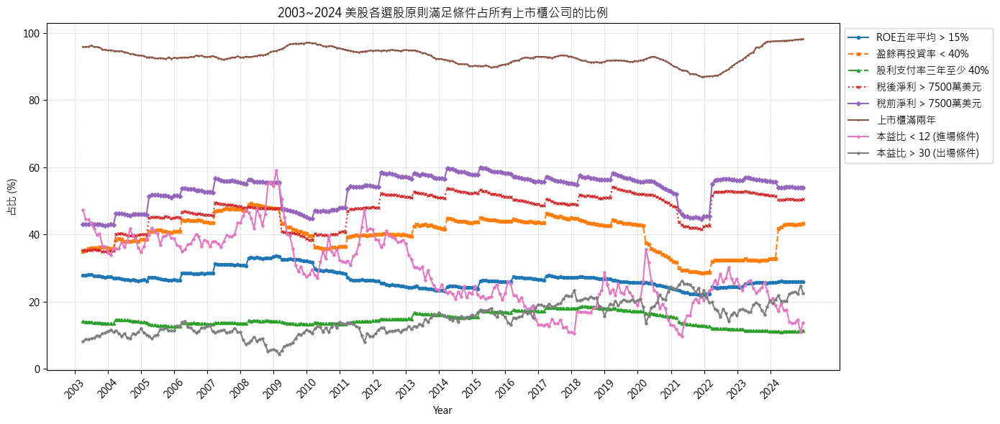

In [20]:
plt.figure(figsize=(14, 6))

roe_data = (roe_cond[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
rr_data = (rr_cond[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
payout_data = (payout_cond[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
profit_data = (netprofit_cond[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
bf_tax_data = (income_bf_tax_cond[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
listed_data = (listed_cond[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
pe_cond_entry_data = (daily_pe_entry[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100
pe_cond_exit_data = (daily_pe_exit[START_DATE:END_DATE].sum(axis=1) / listed_df_count[START_DATE:END_DATE].sum(axis=1).resample('ME').last()) * 100

# 繪製折線圖
plt.plot(roe_data.index, roe_data, marker='o', linestyle='-', markersize=3, label='ROE五年平均 > 15%')
plt.plot(rr_data.index, rr_data, marker='s', linestyle='--', markersize=3, label='盈餘再投資率 < 40%')
plt.plot(payout_data.index, payout_data, marker='^', linestyle='-.', markersize=3, label='股利支付率三年至少 40%')
plt.plot(profit_data.index, profit_data, marker='x', linestyle=':', markersize=3, label='稅後淨利 > 7500萬美元')
plt.plot(bf_tax_data.index, bf_tax_data, marker='D', linestyle='-', markersize=3, label='稅前淨利 > 7500萬美元')
plt.plot(listed_data.index, listed_data, marker='o', linestyle='-', markersize=1, label='上市櫃滿兩年')
plt.plot(pe_cond_entry_data.index, pe_cond_entry_data, marker='*', linestyle='-', markersize=3, label='本益比 < 12 (進場條件)')
plt.plot(pe_cond_exit_data.index, pe_cond_exit_data, marker='*', linestyle='-', markersize=3, label='本益比 > 30 (出場條件)')

# 設置 X 軸為每年年份
plt.xlabel("Year")
plt.ylabel("占比 (%)")
plt.title("2003~2024 美股各選股原則滿足條件占所有上市櫃公司的比例")
plt.grid(True)
plt.xticks(
    ticks=pd.date_range(start="2003-01-01", end="2024-12-31", freq="YS"),
    labels=pd.date_range(start="2003-01-01", end="2024-12-31", freq="YS").strftime("%Y"),
    rotation=45
)


plt.grid(linestyle='--', linewidth=0.5, alpha=0.6)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))  # 將圖例移動到圖表右上角外
plt.tight_layout()
plt.show()

---

## 羅素1000清單

In [21]:
russell_1000_df = pd.read_csv('./russell_component_lists/russell_1000_company.csv')
russell_1000_symbol = russell_1000_df['Symbol'].to_list()
filtered_russell_1000_symbol = [symbol for symbol in russell_1000_symbol if symbol in close.columns]

## 回測

In [22]:
# 無本益比進出場 #
# 稅後淨利條件
orig_all_cond = (roe_cond & rr_cond & payout_cond & netprofit_cond & listed_cond)[START_DATE:END_DATE]
# 稅前淨利條件
orig_all_cond_inc_bf_tax = (roe_cond & rr_cond & payout_cond & income_bf_tax_cond & listed_cond)[START_DATE:END_DATE]

# 有本益比進出場 #
# 每季本益比 #
# 稅後淨利條件
orig_all_cond_and_pe = ((orig_all_cond & pe_cond_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond) | pe_cond_exit[START_DATE:END_DATE]))
# 稅前淨利條件
orig_all_cond_and_pe_inc_bf_tax = ((orig_all_cond_inc_bf_tax & pe_cond_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond_inc_bf_tax) | pe_cond_exit[START_DATE:END_DATE]))

# 每月月底本益比 #
# 稅後淨利條件
orig_all_cond_and_pe_daily = ((orig_all_cond & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond) | daily_pe_exit[START_DATE:END_DATE]))
# 稅前淨利條件
orig_all_cond_and_pe_daily_inc_bf_tax = ((orig_all_cond_inc_bf_tax & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond_inc_bf_tax) | daily_pe_exit[START_DATE:END_DATE]))

In [23]:
orig_all_cond_and_pe_daily_rep = backtest.sim(orig_all_cond_and_pe_daily, resample='ME', data=data)
orig_all_cond_and_pe_daily_rep.display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,10.78%,23.99,-53.11%,68.18%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
K,2018-05-01,2024-10-01,2018-04-30,2024-09-30,0.038462,1615.0,4611.0,6226.0,0.839346,-0.081862,0.853015,0.294657,-0.301000,1537.0,0.0000,0.000000
PSA,2022-12-01,2024-10-01,2022-11-30,2024-09-30,0.047619,459.0,5767.0,6226.0,0.308804,-0.162992,0.336935,0.081130,-0.225802,240.0,0.0000,0.000000
AFG,2023-04-03,NaT,2023-03-31,NaT,0.050000,440.0,5850.0,-1.0,0.189352,-0.117544,0.305772,0.018569,-0.133631,272.0,0.0625,0.066667
ALX,2024-05-01,NaT,2024-04-30,NaT,0.055556,169.0,6121.0,-1.0,-0.050157,-0.049177,0.182171,0.182171,-0.195698,144.0,0.0625,0.066667
AMCR,2023-11-01,NaT,2023-10-31,NaT,0.052632,293.0,5997.0,-1.0,0.126473,0.000000,0.370773,0.000000,-0.177093,292.0,0.0625,0.066667
APAM,2022-04-01,NaT,2022-03-31,NaT,0.055556,691.0,5599.0,-1.0,0.298113,-0.319052,0.491948,0.046187,-0.349114,391.0,0.0625,0.066667
BKE,2022-06-01,NaT,2022-05-31,NaT,0.052632,650.0,5640.0,-1.0,0.908807,-0.168051,1.042296,0.002266,-0.336138,599.0,0.0625,0.066667
CNA,2022-04-01,NaT,2022-03-31,NaT,0.055556,691.0,5599.0,-1.0,0.147731,-0.253471,0.243418,0.004308,-0.256673,231.0,0.0625,0.066667
CPB,2020-12-01,NaT,2020-11-30,2024-12-31,0.043478,1027.0,5263.0,-1.0,-0.063345,-0.179928,0.221067,0.056962,-0.318030,409.0,0.0625,0.000000


In [24]:
rep_all_cond_dic = {}

rep_all_cond_dic['美股_原始條件_稅後淨利_不含本益比進出場'] = orig_all_cond
rep_all_cond_dic['美股_原始條件_稅前淨利_不含本益比進出場'] = orig_all_cond_inc_bf_tax

# rep_all_cond_dic['美股_原始條件_稅後淨利_每季本益比進出場'] = orig_all_cond_and_pe
# rep_all_cond_dic['美股_原始條件_稅前淨利_每季本益比進出場'] = orig_all_cond_and_pe_inc_bf_tax

rep_all_cond_dic['美股_原始條件_稅後淨利_每月月底本益比進出場'] = orig_all_cond_and_pe_daily
rep_all_cond_dic['美股_原始條件_稅前淨利_每月月底本益比進出場'] = orig_all_cond_and_pe_daily_inc_bf_tax

In [25]:
rep_all_cond = sim_conditions(rep_all_cond_dic, resample='ME', data=data)

Backtesting progress:   0%|          | 0/4 [00:00<?, ?condition/s]

Backtesting progress: 100%|██████████| 4/4 [00:11<00:00,  2.79s/condition]


In [26]:
# rep_all_cond.plot_creturns()

In [27]:
# rep_all_cond.plot_stats()

In [28]:
rep_all_cond.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
美股_原始條件_稅前淨利_不含本益比進出場,11.04,-50.79,43.19,39.0,27.25,63.00,13.0,76.0
美股_原始條件_稅前淨利_每月月底本益比進出場,11.01,-51.16,22.81,24.0,18.00,28.00,10.0,37.0
美股_原始條件_稅後淨利_每月月底本益比進出場,10.78,-53.11,22.28,24.0,18.00,26.75,11.0,38.0
美股_原始條件_稅後淨利_不含本益比進出場,10.75,-52.54,41.71,37.0,28.00,58.00,14.0,75.0


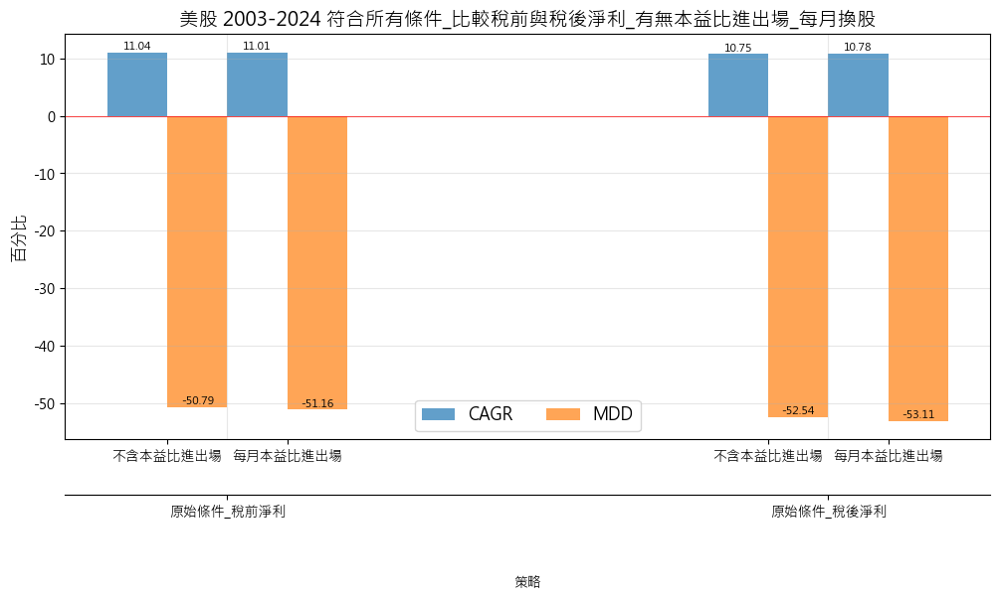

In [29]:
rep_all_cond_df = rep_all_cond.selected_stock_count_analysis()
rep_all_cond_df = rep_all_cond_df.reset_index()

# 分組資料
no_pe = rep_all_cond_df[rep_all_cond_df['Strategy'].str.contains('不含本益比進出場')]
monthly_pe = rep_all_cond_df[rep_all_cond_df['Strategy'].str.contains('月底本益比進出場')]

# 提取x軸標籤
no_pe_labels = [s.split('_')[1:3] for s in no_pe['Strategy']]
no_pe_labels = ['_'.join(label) for label in no_pe_labels]

# 設置圖表
plt.figure(figsize=(12, 6))
width = 0.1

# 設置x軸位置
x = range(len(no_pe_labels))

# 繪製bars
bars1 = plt.bar([i - width*1.5 for i in x], no_pe['CAGR (%)'], width, label='CAGR', color='tab:blue', alpha=0.7)
bars2 = plt.bar([i - width/2 for i in x], no_pe['MDD (%)'], width, label='MDD', color='tab:orange', alpha=0.7)
bars3 = plt.bar([i + width/2 for i in x], monthly_pe['CAGR (%)'], width, label='', color='tab:blue', alpha=0.7)
bars4 = plt.bar([i + width*1.5 for i in x], monthly_pe['MDD (%)'], width, label='', color='tab:orange', alpha=0.7)

# 添加數值標籤
for bar in bars1:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=8)

for bar in bars2:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=8)

for bar in bars3:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=8)

for bar in bars4:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=8)

# 獲取軸對象
ax = plt.gca()

# 設置Y軸刻度，以10為間隔
ax.yaxis.set_major_locator(plt.MultipleLocator(10))

# 設置網格線
plt.grid(True, alpha=0.3, which='both', axis='both')

# 設置主要x軸標籤（策略名稱）
ax.set_xticks([i for i in x])
ax.set_xticklabels(no_pe_labels, rotation=0)

# 添加次要x軸標籤（本益比條件）
ax2 = ax.secondary_xaxis('bottom') 
# 調整標籤位置，使其對齊對應的柱狀圖組
ax2.set_xticks([i - width for i in x] + [i + width for i in x])
ax2.set_xticklabels(['不含本益比進出場']*len(no_pe_labels) + ['每月本益比進出場']*len(no_pe_labels), fontsize=10)

# 移動主要x軸到次要x軸的下方
ax.xaxis.set_label_position('bottom')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('outward', 40))

# 設置圖表外觀
ax.set_xlabel('策略', labelpad=40)  # 增加labelpad使標籤遠離軸
ax.tick_params(axis='y', labelsize=10)

plt.ylabel('百分比', fontsize=12)
plt.title('美股 2003-2024 符合所有條件_比較稅前與稅後淨利_有無本益比進出場_每月換股', fontsize=14)
plt.legend(loc='lower center', ncol=2, fontsize=12)
plt.axhline(0, color='red', linewidth=0.5)

# 調整版面配置
plt.subplots_adjust(bottom=0.2)  # 增加底部空間以容納標籤

# 顯示圖表
plt.show()

In [30]:
# rep_all_cond.selected_stock_count_analysis(ratio=True)

In [31]:
rep_all_cond.holding_period_analysis()

,CAGR (%),MDD (%),持有期間平均,25%,中位數,75%,最大值,最小值
Strategy,,,,,,,,
美股_原始條件_稅前淨利_不含本益比進出場,11.04,-50.79,1118.937908,365.0,728.5,1460.5,7945.0,31.0
美股_原始條件_稅前淨利_每月月底本益比進出場,11.01,-51.16,944.911458,336.0,455.5,1105.0,5935.0,31.0
美股_原始條件_稅後淨利_每月月底本益比進出場,10.78,-53.11,923.067708,336.0,412.0,1066.0,5935.0,31.0
美股_原始條件_稅後淨利_不含本益比進出場,10.75,-52.54,1106.147157,365.0,701.0,1444.5,7945.0,31.0


---

In [32]:
# rep_all_cond.reports['美股_原始條件_稅後淨利_不含本益比進出場'].display()

In [33]:
orig_strat_pos, orig_strat_neg = rep_all_cond.reports['美股_原始條件_稅後淨利_不含本益比進出場'].calc_returns_contrib(5)

In [34]:
orig_daily_pe_strat_pos, orig_daily_pe_strat_neg = rep_all_cond.reports['美股_原始條件_稅後淨利_每月月底本益比進出場'].calc_returns_contrib(5)

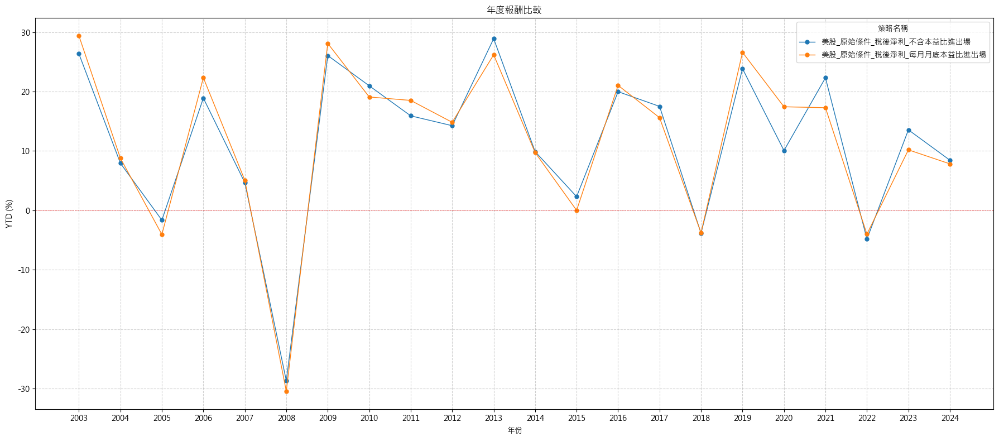

In [35]:
rep_all_cond.visualize_ytd_performance(['美股_原始條件_稅後淨利_不含本益比進出場', '美股_原始條件_稅後淨利_每月月底本益比進出場'])

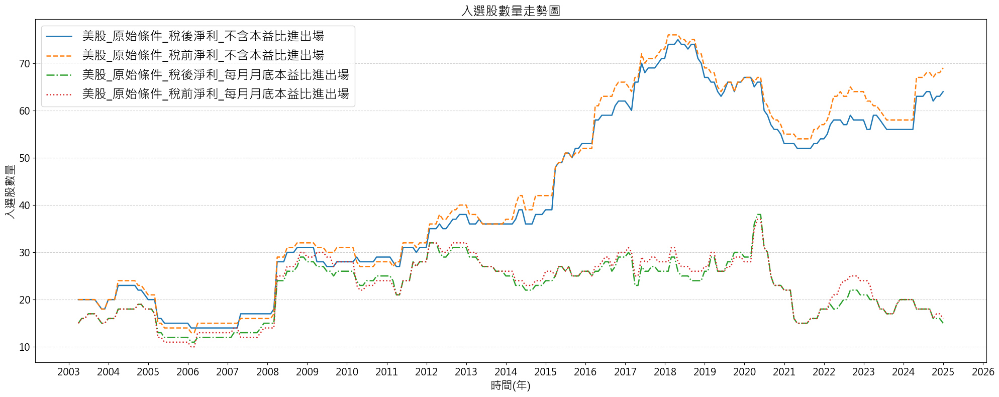

In [36]:
rep_all_cond.plot_reps_stock_counts()

In [37]:
rep_all_cond.reports['美股_原始條件_稅後淨利_每月月底本益比進出場'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,10.78%,23.99,-53.11%,68.18%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
K,2018-05-01,2024-10-01,2018-04-30,2024-09-30,0.038462,1615.0,4611.0,6226.0,0.839346,-0.081862,0.853015,0.294657,-0.301000,1537.0,0.0000,0.000000
PSA,2022-12-01,2024-10-01,2022-11-30,2024-09-30,0.047619,459.0,5767.0,6226.0,0.308804,-0.162992,0.336935,0.081130,-0.225802,240.0,0.0000,0.000000
AFG,2023-04-03,NaT,2023-03-31,NaT,0.050000,440.0,5850.0,-1.0,0.189352,-0.117544,0.305772,0.018569,-0.133631,272.0,0.0625,0.066667
ALX,2024-05-01,NaT,2024-04-30,NaT,0.055556,169.0,6121.0,-1.0,-0.050157,-0.049177,0.182171,0.182171,-0.195698,144.0,0.0625,0.066667
AMCR,2023-11-01,NaT,2023-10-31,NaT,0.052632,293.0,5997.0,-1.0,0.126473,0.000000,0.370773,0.000000,-0.177093,292.0,0.0625,0.066667
APAM,2022-04-01,NaT,2022-03-31,NaT,0.055556,691.0,5599.0,-1.0,0.298113,-0.319052,0.491948,0.046187,-0.349114,391.0,0.0625,0.066667
BKE,2022-06-01,NaT,2022-05-31,NaT,0.052632,650.0,5640.0,-1.0,0.908807,-0.168051,1.042296,0.002266,-0.336138,599.0,0.0625,0.066667
CNA,2022-04-01,NaT,2022-03-31,NaT,0.055556,691.0,5599.0,-1.0,0.147731,-0.253471,0.243418,0.004308,-0.256673,231.0,0.0625,0.066667
CPB,2020-12-01,NaT,2020-11-30,2024-12-31,0.043478,1027.0,5263.0,-1.0,-0.063345,-0.179928,0.221067,0.056962,-0.318030,409.0,0.0625,0.000000


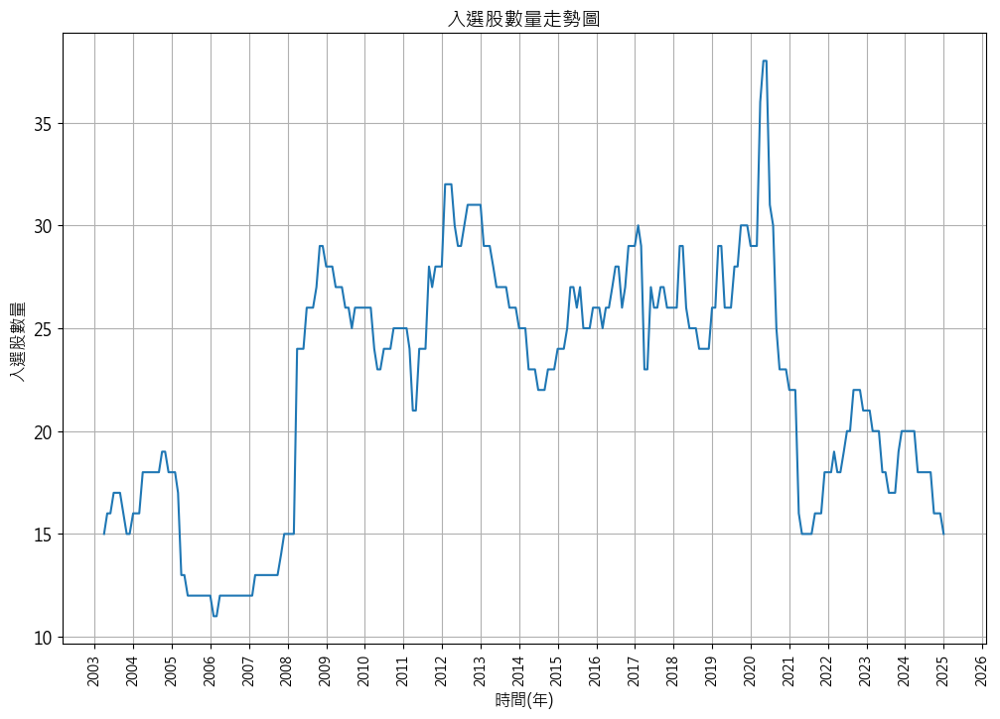

In [38]:
rep_all_cond.reports['美股_原始條件_稅後淨利_每月月底本益比進出場'].plot_company_counts()

## 切分時間段2003~2009、2009~2024

In [39]:
orig_all_cond_2003_2009 = (roe_cond & rr_cond & payout_cond & netprofit_cond & listed_cond)[START_DATE:'2009-3-31']
orig_all_cond_bftax_2003_2009 = (roe_cond & rr_cond & payout_cond & income_bf_tax_cond & listed_cond)[START_DATE:'2009-3-31']

orig_all_cond_2009_2024 = (roe_cond & rr_cond & payout_cond & netprofit_cond & listed_cond)['2009-3-31':END_DATE]
orig_all_cond_bftax_2009_2024 = (roe_cond & rr_cond & payout_cond & income_bf_tax_cond & listed_cond)['2009-3-31':END_DATE]

# all_cond_and_pe_2003_2009 = ((orig_all_cond_2003_2009 & pe_cond_entry[START_DATE:'2009-3-31']).hold_until((~orig_all_cond_2003_2009) | pe_cond_exit[START_DATE:'2009-3-31']))
# all_cond_and_pe_bftax_2003_2009 = ((orig_all_cond_bftax_2003_2009 & pe_cond_entry[START_DATE:'2009-3-31']).hold_until((~orig_all_cond_bftax_2003_2009) | pe_cond_exit[START_DATE:'2009-3-31']))

# all_cond_and_pe_2009_2024 = ((orig_all_cond_2009_2024 & pe_cond_entry['2009-3-31':END_DATE]).hold_until((~orig_all_cond_2009_2024) | pe_cond_exit['2009-3-31':END_DATE]))
# all_cond_and_pe_bftax_2009_2024 = ((orig_all_cond_bftax_2009_2024 & pe_cond_entry['2009-3-31':END_DATE]).hold_until((~orig_all_cond_bftax_2009_2024) | pe_cond_exit['2009-3-31':END_DATE]))

all_cond_and_pe_daily_2003_2009 = ((orig_all_cond_2003_2009 & daily_pe_entry[START_DATE:'2009-3-31']).hold_until((~orig_all_cond_2003_2009) | daily_pe_exit[START_DATE:'2009-3-31']))
all_cond_and_pe_daily_bftax_2003_2009 = ((orig_all_cond_bftax_2003_2009 & daily_pe_entry[START_DATE:'2009-3-31']).hold_until((~orig_all_cond_bftax_2003_2009) | daily_pe_exit[START_DATE:'2009-3-31']))

all_cond_and_pe_daily_2009_2024 = ((orig_all_cond_2009_2024 & daily_pe_entry['2009-3-31':END_DATE]).hold_until((~orig_all_cond_2009_2024) | daily_pe_exit['2009-3-31':END_DATE]))
all_cond_and_pe_daily_bftax_2009_2024 = ((orig_all_cond_bftax_2009_2024 & daily_pe_entry['2009-3-31':END_DATE]).hold_until((~orig_all_cond_bftax_2009_2024) | daily_pe_exit['2009-3-31':END_DATE]))

In [40]:
time_period_dic = {}

time_period_dic['美股_稅後淨利_不含本益比進出場_2003-2009'] = orig_all_cond_2003_2009
time_period_dic['美股_稅前淨利_不含本益比進出場_2003-2009'] = orig_all_cond_bftax_2003_2009
time_period_dic['美股_稅後淨利_不含本益比進出場_2009-2024'] = orig_all_cond_2009_2024
time_period_dic['美股_稅前淨利_不含本益比進出場_2009-2024'] = orig_all_cond_bftax_2009_2024

# time_period_dic['美股_稅後淨利_每季本益比進出場_2003-2009'] = all_cond_and_pe_2003_2009
# time_period_dic['美股_稅前淨利_每季本益比進出場_2003-2009'] = all_cond_and_pe_bftax_2003_2009
# time_period_dic['美股_稅後淨利_每季本益比進出場_2009-2024'] = all_cond_and_pe_2009_2024
# time_period_dic['美股_稅前淨利_每季本益比進出場_2009-2024'] = all_cond_and_pe_bftax_2009_2024

time_period_dic['美股_稅後淨利_每月月底本益比進出場_2003-2009'] = all_cond_and_pe_daily_2003_2009
time_period_dic['美股_稅前淨利_每月月底本益比進出場_2003-2009'] = all_cond_and_pe_daily_bftax_2003_2009
time_period_dic['美股_稅後淨利_每月月底本益比進出場_2009-2024'] = all_cond_and_pe_daily_2009_2024
time_period_dic['美股_稅前淨利_每月月底本益比進出場_2009-2024'] = all_cond_and_pe_daily_bftax_2009_2024

time_period_rep_collec = sim_conditions(time_period_dic, resample='ME', data=data)

Backtesting progress: 100%|██████████| 8/8 [00:18<00:00,  2.27s/condition]


In [41]:
time_period_rep_collec.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
美股_稅前淨利_不含本益比進出場_2009-2024,14.97,-38.26,52.08,56.5,37.0,65.0,27.0,76.0
美股_稅後淨利_不含本益比進出場_2009-2024,14.75,-38.83,50.11,53.5,36.0,62.0,27.0,75.0
美股_稅前淨利_每月月底本益比進出場_2009-2024,14.68,-39.46,25.21,26.0,23.0,28.0,15.0,37.0
美股_稅後淨利_每月月底本益比進出場_2009-2024,14.57,-39.38,24.48,25.0,22.0,27.0,15.0,38.0
美股_稅前淨利_每月月底本益比進出場_2003-2009,1.36,-51.16,16.63,15.0,13.0,18.0,10.0,30.0
美股_稅前淨利_不含本益比進出場_2003-2009,1.00,-50.79,19.90,18.0,15.0,24.0,13.0,32.0
美股_稅後淨利_每月月底本益比進出場_2003-2009,0.82,-53.11,16.56,15.0,12.0,18.0,11.0,29.0
美股_稅後淨利_不含本益比進出場_2003-2009,0.53,-52.54,19.67,18.0,15.0,23.0,14.0,31.0


In [42]:
def plot_grouped_bar_chart(df):
    # 重置索引
    df.reset_index(inplace=True)
    
    # 解析 Strategy column
    df[['條件', '策略', '時間段']] = df['Strategy'].str.split('_', expand=True).iloc[:, 1:]

    # 排除非數值列
    numeric_columns = df.select_dtypes(include='number').columns
    grouped = df.groupby(['條件', '策略', '時間段'])[numeric_columns].mean().reset_index()

    # 獲取 unique 的條件和策略
    conditions = grouped['條件'].unique()
    strategies = grouped['策略'].unique()

    # 設置 bar 的寬度和位置
    bar_width = 0.2
    index = range(len(conditions) * len(strategies))

    # 創建子圖
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 8))

    # 繪製 CAGR (%) 的 grouped bar chart
    for i, time_period in enumerate(['2003-2009', '2009-2024']):
        data = grouped[grouped['時間段'] == time_period]
        cagr_values = data['CAGR (%)'].values
        bar_positions = [x + i * bar_width for x in index]
        ax1.bar(bar_positions, cagr_values, bar_width, label=f'{time_period}')

    # 設置 x 軸標籤
    ax1.set_xticks([x + bar_width / 2 for x in index])
    ax1.set_xticklabels([f'{cond}_{strat}' for cond in conditions for strat in strategies], rotation=0, ha='center', fontsize=14)
    ax1.grid(True, alpha=0.3)

    # 添加標籤和標題
    ax1.set_xlabel('Strategy')
    ax1.set_ylabel('CAGR (%)', fontsize=14)
    ax1.yaxis.set_major_locator(FixedLocator(ax1.get_yticks()))
    ax1.yaxis.set_major_formatter(FixedFormatter([f'{int(x)}' for x in ax1.get_yticks()]))
    ax1.set_title('美股 2009-2009、2009-2024 不同時間段 CAGR 比較', fontsize=18)
    ax1.tick_params(axis='y', labelsize=16)  # 設置Y軸刻度字體大小

    # 繪製 MDD (%) 的 grouped bar chart
    for i, time_period in enumerate(['2003-2009', '2009-2024']):
        data = grouped[grouped['時間段'] == time_period]
        mdd_values = data['MDD (%)'].values
        bar_positions = [x + i * bar_width for x in index]
        ax2.bar(bar_positions, mdd_values, bar_width, label=f'{time_period}')

    # 設置 x 軸標籤
    ax2.set_xticks([x + bar_width / 2 for x in index])
    ax2.set_xticklabels([f'{cond}_{strat}' for cond in conditions for strat in strategies], rotation=0, ha='center', fontsize=14)

    # 添加標籤和標題
    ax2.set_xlabel('Strategy')
    ax2.set_ylabel('MDD (%)', fontsize=14)
    ax2.yaxis.set_major_locator(FixedLocator(ax2.get_yticks()))
    ax2.yaxis.set_major_formatter(FixedFormatter([f'{int(x)}' for x in ax2.get_yticks()]))
    ax2.set_title('美股 2009-2009、2009-2024 不同時間段 MDD 比較', fontsize=18)
    ax2.grid(True, alpha=0.3)
    ax2.tick_params(axis='y', labelsize=16)  # 設置Y軸刻度字體大小

    # 添加統一的 legend
    handles, labels = ax1.get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=2, fontsize=18)

    plt.tight_layout(rect=[0, 0.05, 1, 1])
    plt.show()

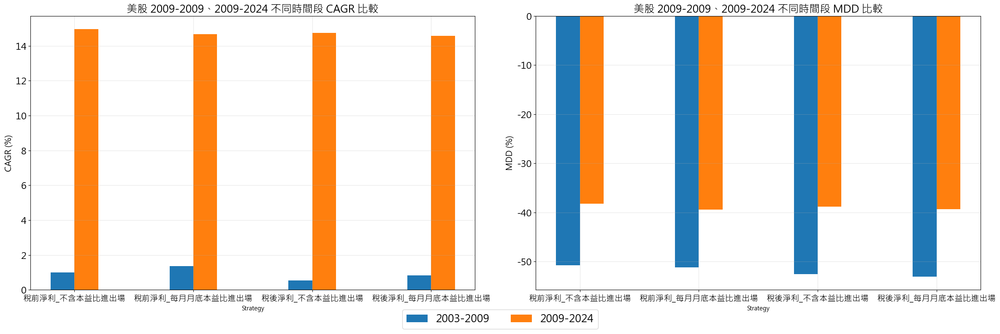

In [43]:
time_period_test_df = time_period_rep_collec.selected_stock_count_analysis()
plot_grouped_bar_chart(time_period_test_df)

In [44]:
us_bench = data.get('ruaindex:close')[START_DATE:END_DATE]
us_bench['close'] = us_bench['close'] / us_bench['close'].iloc[0]

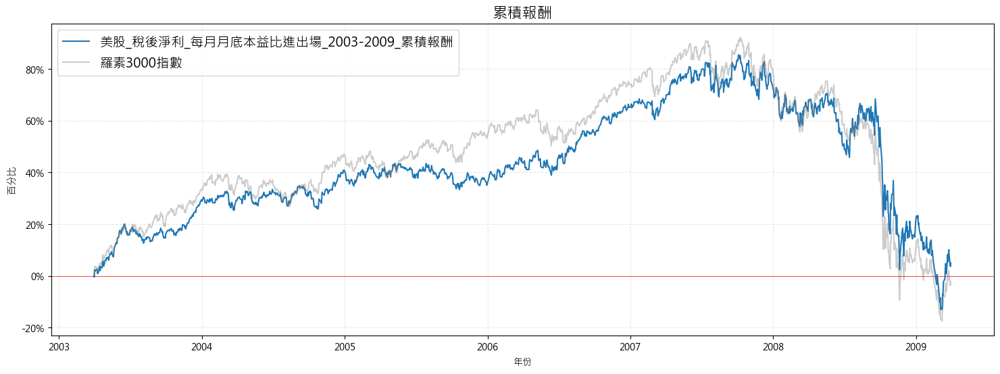

In [45]:
cum_returns = time_period_rep_collec.reports['美股_稅後淨利_每月月底本益比進出場_2003-2009'].stock_data['cum_returns']
us_close = us_bench['close'].reindex(cum_returns.index)

plt.figure(figsize=(18, 6))

# Plot cumulative returns
plt.plot(cum_returns.index, cum_returns, label='美股_稅後淨利_每月月底本益比進出場_2003-2009_累積報酬')

# Plot normalized close prices
plt.plot(us_close.index, us_close, label='羅素3000指數', color='gray', alpha=0.4)

plt.xlabel('年份')
plt.ylabel('百分比')
plt.axhline(1, color='red', linewidth=0.5)
plt.title('累積報酬', fontsize=16)
plt.legend(fontsize=14)
plt.grid(True, alpha=0.3, linestyle='--')

# Custom y-ticks formatter
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, pos: f'{(x - 1) * 100:.0f}%'))

plt.show()


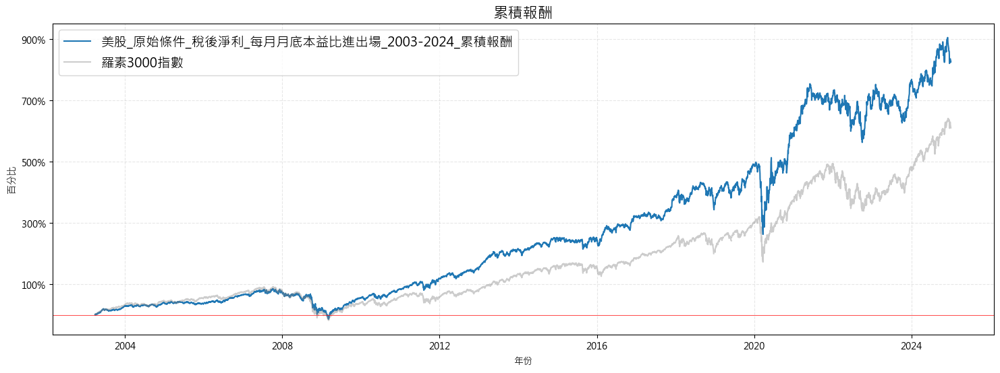

In [46]:
cum_returns = rep_all_cond.reports['美股_原始條件_稅後淨利_每月月底本益比進出場'].stock_data['cum_returns']
us_close = us_bench['close'].reindex(cum_returns.index)

plt.figure(figsize=(18, 6))

# Plot cumulative returns
plt.plot(cum_returns.index, cum_returns, label='美股_原始條件_稅後淨利_每月月底本益比進出場_2003-2024_累積報酬')

# Plot normalized close prices
plt.plot(us_close.index, us_close, label='羅素3000指數', color='gray', alpha=0.4)

plt.xlabel('年份')
plt.ylabel('百分比')
plt.axhline(1, color='red', linewidth=0.5)
plt.title('累積報酬', fontsize=16)
plt.legend(fontsize=14)
plt.grid(True, alpha=0.3, linestyle='--')

# Custom y-ticks formatter
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, pos: f'{(x - 1) * 100:.0f}%'))

plt.show()


## 美股_布林通道濾網

In [47]:
us_benchmark = data.get('ruaindex:close')['2002':'2024']
upperband, middleband, lowerband = talib.BBANDS(us_benchmark.close, timeperiod=300, nbdevup=2.0, nbdevdn=2.0)

### 建立濾網
1. 第一次跌破下通道先記錄下來，等到下一次跌破而且到更低的收盤價賣出
2. 等回到均線之上再買入

In [48]:
# 創建一個買賣訊號的DataFrame，初始值全部為True
us_bollinger_signal = pd.Series(True, index=us_benchmark.index)

# 記錄第一次跌破的價格
first_break_price = None
# 記錄是否已經回到lower band之上
crossed_above_lower = False
# 是否進入持續的 False 狀態直到突破中通道
in_selling_state = False

# 遍歷所有的日期
for date in us_benchmark.index:
    price = us_benchmark.close[date]
    lower = lowerband[date]
    middle = middleband[date]
    
    # 第一次跌破下通道
    if price < lower and first_break_price is None:
        first_break_price = price
        crossed_above_lower = False
    
    # 價格回到下通道之上
    elif price > lower:
        crossed_above_lower = True
    
    # 再次跌破下通道且符合賣出條件
    if price < lower and crossed_above_lower and price < first_break_price:

        # print(f'{date} - {price} - {lower} - {first_break_price}')
        
        us_bollinger_signal[date] = False
        in_selling_state = True
    
    # 突破中通道則重置狀態
    if price > middle:
        us_bollinger_signal[date] = True
        first_break_price = None
        crossed_above_lower = False
        in_selling_state = False
    
    # 在突破中通道之前保持賣出狀態
    if in_selling_state and price <= middle:
        us_bollinger_signal[date] = False

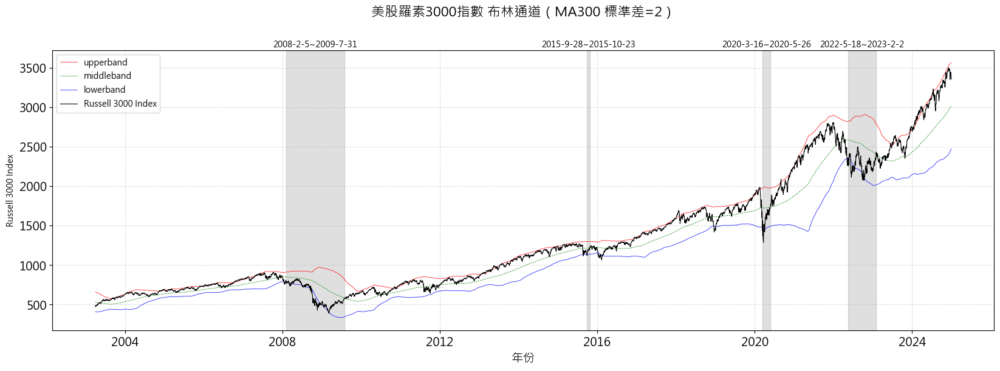

In [49]:
plt.figure(figsize=(20, 6))

plt.plot(upperband['2003-3-31':'2024'],
         label="upperband",color='r',
         linestyle='solid', linewidth=0.5)
plt.plot(middleband['2003-3-31':'2024'],
         label="middleband",color='g',linestyle='--', linewidth=0.5)
plt.plot(lowerband['2003-3-31':'2024'],
         label="lowerband",color='b',
         linestyle='solid', linewidth=0.5)
plt.plot(us_benchmark['2003-3-31':'2024'],
         label="Russell 3000 Index",color='black', linewidth=0.8)

# # 添加背景顏色
# plt.axvspan(pd.Timestamp('2008-2-5'), pd.Timestamp('2009-7-31'), color='gray', alpha=0.25)
# plt.axvspan(pd.Timestamp('2015-9-28'), pd.Timestamp('2015-10-23'), color='gray', alpha=0.25)
# plt.axvspan(pd.Timestamp('2020-3-16'), pd.Timestamp('2020-5-26'), color='gray', alpha=0.25)
# plt.axvspan(pd.Timestamp('2022-5-18'), pd.Timestamp('2023-2-2'), color='gray', alpha=0.25)

spans = [
    ('2008-2-5', '2009-7-31'),
    ('2015-9-28', '2015-10-23'),
    ('2020-3-16', '2020-5-26'),
    ('2022-5-18', '2023-2-2')
]

# 繪製灰底和添加標籤
for start, end in spans:
    # 添加灰底
    plt.axvspan(pd.Timestamp(start), pd.Timestamp(end), color='gray', alpha=0.25)
    
    # 計算區間中點位置(用於放置標籤)
    mid_point = pd.Timestamp(start) + (pd.Timestamp(end) - pd.Timestamp(start))/2
    
    # 添加日期區間標籤
    label_text = f'{start}~{end}'
    plt.text(mid_point, plt.ylim()[1]*1.01, label_text,
             horizontalalignment='center',
             fontsize=10)

plt.title("美股羅素3000指數 布林通道（MA300 標準差=2）", fontsize=16, pad=40) 
plt.xlabel("年份", fontsize=14)
plt.xticks(fontsize=14)
plt.ylabel("Russell 3000 Index")
plt.yticks(fontsize=14)

plt.legend()
plt.grid(True, linestyle='--', alpha=0.4)
plt.show()

In [50]:
bolling_filt = orig_all_cond.copy()

# 將 df 的 index 對齊 us_bollinger_signal_1 的 index，並填充為 True，這樣可以保證日期範圍內的所有日期都包括
aligned_signal = us_bollinger_signal.reindex(bolling_filt.index, method='ffill', fill_value=True)

# 將 df 中日期對應的行設置為 aligned_signal 的值
bolling_filt.loc[aligned_signal.index, :] = aligned_signal.values[:, None]

In [51]:
filtered_russell_1000_symbol = [symbol for symbol in filtered_russell_1000_symbol if symbol not in ['ALAB', 'LOAR']]

In [52]:
# END_DATE = '2009-3-31'

In [53]:
# bf_tax_cond = income_bf_tax > 75000000
orig_cond_bft = rr_cond & roe_cond & income_bf_tax_cond & payout_cond & listed_cond
nodpr_bft_cond = rr_cond & roe_cond & income_bf_tax_cond & listed_cond


overall_russell_filt_conds = {}

# overall_conds['所有條件_盈再率<80_無本益比'] = orig_cond
overall_russell_filt_conds['所有條件_無本益比'] = orig_all_cond[START_DATE:END_DATE]
# overall_conds['所有條件_無本益比_稅前淨利'] = orig_cond_bft[START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_無本益比_羅素1000'] = orig_all_cond[filtered_russell_1000_symbol][START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_無本益比_羅素1000_布林通道'] = (orig_all_cond[filtered_russell_1000_symbol] & bolling_filt)[START_DATE:END_DATE]
# overall_conds['所有條件_無本益比_稅前淨利_羅素1000'] = orig_cond_bft[START_DATE:END_DATE][filtered_russell_1000_symbol]
overall_russell_filt_conds['所有條件_無本益比_布林通道'] = (orig_all_cond & bolling_filt)[START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_無本益比_ROE出場條件'] = (orig_all_cond & (roe > 0.15))[START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_無本益比_ROE出場條件_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE] & (roe[START_DATE:END_DATE] > 0.15))[START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_無本益比_ROE出場條件_羅素1000'] = (orig_all_cond & (roe[START_DATE:END_DATE] > 0.15))[filtered_russell_1000_symbol][START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_無本益比_ROE出場條件_羅素1000_布林通道'] = (orig_all_cond & bolling_filt & (roe[START_DATE:END_DATE] > 0.15))[filtered_russell_1000_symbol][START_DATE:END_DATE]

# overall_conds['所有條件_盈再率<80_每季本益比'] = orig_quarter_pe
overall_russell_filt_conds['所有條件_有本益比'] = orig_all_cond_and_pe_daily
overall_russell_filt_conds['所有條件_有本益比_ROE出場條件'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15))
overall_russell_filt_conds['所有條件_有本益比_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | ~bolling_filt[START_DATE:END_DATE])
overall_russell_filt_conds['所有條件_有本益比_ROE出場條件_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15) | ~bolling_filt[START_DATE:END_DATE])
overall_russell_filt_conds['所有條件_有本益比_ROE出場條件_羅素1000_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15) | ~bolling_filt[START_DATE:END_DATE])[filtered_russell_1000_symbol]


# overall_conds['所有條件_有本益比_稅前淨利'] = (orig_cond_bft[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_cond_bft[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])
overall_russell_filt_conds['所有條件_有本益比_羅素1000'] = orig_all_cond_and_pe_daily[filtered_russell_1000_symbol][START_DATE:END_DATE]
overall_russell_filt_conds['所有條件_有本益比_羅素1000_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | ~bolling_filt[START_DATE:END_DATE])[filtered_russell_1000_symbol]
overall_russell_filt_conds['所有條件_有本益比_ROE出場條件_羅素1000'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15))[filtered_russell_1000_symbol] 
# overall_conds['所有條件_有本益比_稅前淨利_羅素1000'] = (orig_cond_bft[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_cond_bft[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])[filtered_russell_1000_symbol]

# # overall_conds['去掉配息盈再率<80_無本益比'] = test_cond
# overall_conds['去掉配息_無本益比'] = nodpr_cond_opt
# # overall_conds['去掉配息_無本益比_稅前淨利'] = nodpr_bft_cond[START_DATE:END_DATE]
# overall_conds['去掉配息_無本益比_羅素1000'] = nodpr_cond_opt_filter
# # overall_conds['去掉配息_無本益比_稅前淨利_羅素1000'] = nodpr_bft_cond[START_DATE:END_DATE][filtered_russell_1000_symbol]
# # overall_conds['去掉配息_盈再率<80_每季本益比'] = test_noDPR_pe
# overall_conds['去掉配息_無本益比_布林通道'] = nodpr_cond_opt & bolling_1_filt

# overall_conds['去掉配息_有本益比'] = opt_noDPR_pe
# overall_conds['去掉配息_有本益比_ROE出場條件'] = (nodpr_cond_opt & daily_pe_entry[START_DATE:END_DATE]).hold_until((~nodpr_cond_opt) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15))
# # overall_conds['去掉配息_有本益比_稅前淨利'] = (nodpr_bft_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~nodpr_bft_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])
# overall_conds['去掉配息_有本益比_布林通道'] = (nodpr_cond_opt & daily_pe_entry[START_DATE:END_DATE]).hold_until((~nodpr_cond_opt) | daily_pe_exit[START_DATE:END_DATE] | ~bolling_1_filt)
# overall_conds['去掉配息_有本益比_布林通道_ROE出場條件'] = (nodpr_cond_opt & daily_pe_entry[START_DATE:END_DATE]).hold_until((~nodpr_cond_opt) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15) | ~bolling_1_filt)

# overall_conds['去掉配息_有本益比_羅素1000'] = opt_noDPR_pe_filt
# overall_conds['去掉配息_有本益比_羅素1000_ROE出場條件'] = (nodpr_cond_opt_filter & daily_pe_entry[START_DATE:END_DATE]).hold_until((~nodpr_cond_opt_filter) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15))
# # overall_conds['去掉配息_有本益比_稅前淨利_羅素1000'] = (nodpr_bft_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~nodpr_bft_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])[filtered_russell_1000_symbol]


# overall_conds['單一條件_ROE五年平均'] = roe_cond[START_DATE:END_DATE]
# # overall_conds['單一條件_ROE五年平均_布林通道'] = roe_cond[START_DATE:END_DATE] & bolling_1_filt
# overall_conds['單一條件_ROE五年平均_羅素1000'] = roe_cond[START_DATE:END_DATE][filtered_russell_1000_symbol]

# overall_conds['單一條件_盈再率<40%'] = rr_cond[START_DATE:END_DATE]
# overall_conds['單一條件_盈再率<40%_羅素1000'] = rr_cond[START_DATE:END_DATE][filtered_russell_1000_symbol]
# # overall_conds['單一條件_盈再率<80%'] = (rr<0.8)[START_DATE:END_DATE]


overall_russell_filt_collecs = sim_conditions(overall_russell_filt_conds, resample='ME', data=data)
overall_russell_filt_collecs.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 16/16 [00:36<00:00,  2.30s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
所有條件_無本益比_ROE出場條件_羅素1000,12.41,-45.81,31.05,31.0,21.0,43.00,8.0,50.0
所有條件_有本益比_ROE出場條件_羅素1000_布林通道,11.92,-37.97,10.99,10.0,7.0,17.00,0.0,24.0
所有條件_無本益比_羅素1000,11.60,-49.98,35.50,34.0,25.0,48.00,13.0,59.0
所有條件_有本益比_ROE出場條件,11.55,-50.62,19.11,20.0,15.0,23.00,8.0,32.0
所有條件_有本益比_ROE出場條件_羅素1000,11.37,-51.44,14.56,14.0,12.0,18.00,7.0,24.0
所有條件_無本益比_ROE出場條件,11.35,-48.60,36.34,34.0,22.0,53.00,9.0,62.0
所有條件_有本益比_ROE出場條件_布林通道,11.15,-37.20,13.33,12.0,10.0,19.00,0.0,26.0
所有條件_無本益比_ROE出場條件_羅素1000_布林通道,11.05,-37.42,27.07,29.0,13.0,42.00,0.0,50.0
所有條件_有本益比_羅素1000,10.88,-50.26,18.33,18.0,15.0,22.75,10.0,27.0


In [54]:
overall_russell_filt_collecs.reports['所有條件_有本益比_ROE出場條件_羅素1000_布林通道'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,11.92%,24.62,-37.97%,74.14%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
PSA,2023-03-01,2024-10-01,2023-02-28,2024-09-30,0.250000,399,5827,6226,0.299071,-0.169169,0.327068,0.073150,-0.225802,184.0,0.000000,0.000000
AFG,2023-04-03,NaT,2023-03-31,NaT,0.166667,440,5850,-1,0.189352,-0.117544,0.305772,0.018569,-0.133631,272.0,0.166667,0.166667
AMCR,2023-11-01,NaT,2023-10-31,NaT,0.125000,293,5997,-1,0.126473,0.000000,0.370773,0.000000,-0.177093,292.0,0.166667,0.166667
EOG,2024-05-01,NaT,2024-04-30,NaT,0.142857,169,6121,-1,-0.060136,-0.090120,0.058040,0.014258,-0.134173,40.0,0.166667,0.166667
IPG,2023-11-01,NaT,2023-10-31,NaT,0.125000,293,5997,-1,0.020147,-0.014706,0.191544,0.191544,-0.173095,291.0,0.166667,0.166667
OMC,2023-09-01,NaT,2023-08-31,NaT,0.166667,335,5955,-1,0.105809,-0.088186,0.357152,0.000000,-0.179933,275.0,0.166667,0.166667
OMF,2023-03-01,NaT,2023-02-28,NaT,0.250000,463,5827,-1,0.376436,-0.218085,0.527394,0.005319,-0.257811,324.0,0.166667,0.166667


In [55]:
russell_filt_df = overall_russell_filt_collecs.selected_stock_count_analysis()

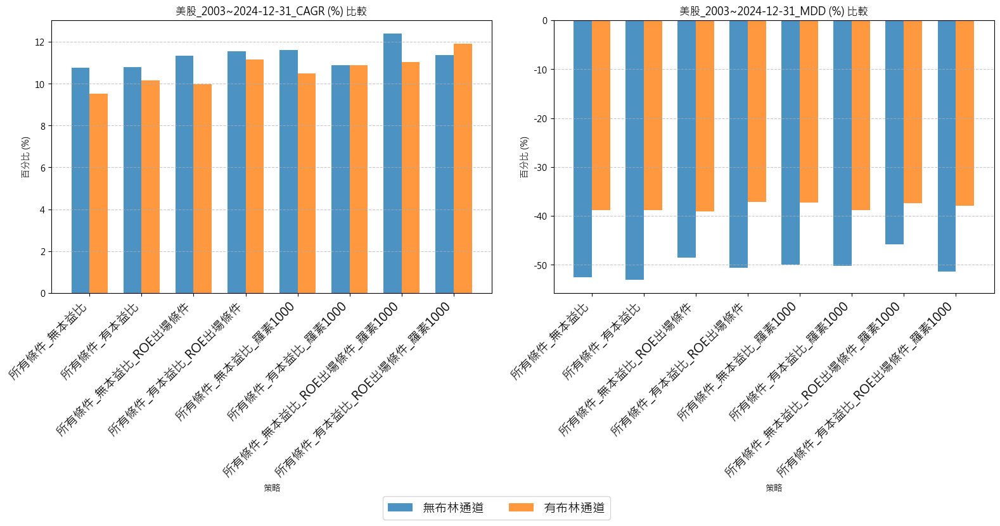

In [56]:
def plot_grouped_bolling_chart(russell_filt_df):

    df = russell_filt_df.copy()
    df.reset_index(inplace=True)
    
    # 創建新的欄位來標記是否包含布林通道
    df['has_bolling'] = df['Strategy'].str.contains('布林通道')
    
    # 獲取基本策略名稱（布林通道之前的部分）
    def get_base_strategy(strategy):
        if '布林通道' in strategy:
            return strategy.split('_布林通道')[0]
        return strategy
    
    df['base_strategy'] = df['Strategy'].apply(get_base_strategy)
    
    # 定義策略順序
    strategy_order = [
        "所有條件_無本益比",
        "所有條件_有本益比",
        "所有條件_無本益比_ROE出場條件",
        "所有條件_有本益比_ROE出場條件",
        "所有條件_無本益比_羅素1000",
        "所有條件_有本益比_羅素1000",
        "所有條件_無本益比_ROE出場條件_羅素1000",
        "所有條件_有本益比_ROE出場條件_羅素1000"
    ]
    
    # 按照指定順序篩選基本策略
    base_strategies = [s for s in strategy_order if s in df['base_strategy'].unique()]
    n_strategies = len(base_strategies)
    
    # 準備繪圖數據
    metrics = ['CAGR (%)', 'MDD (%)']
    
    # 設置圖形大小和樣式
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(max(16, n_strategies * 2), 8))
    bar_width = 0.35
    
    # 設置每組柱狀圖的位置
    indices = range(n_strategies)
    
    # 繪製分組柱狀圖
    for i, (metric, ax) in enumerate(zip(metrics, [ax1, ax2])):
        # 無布林通道的數據
        no_bolling_values = [
            df[(df['base_strategy'] == strategy) & (~df['has_bolling'])][metric].iloc[0]
            if len(df[(df['base_strategy'] == strategy) & (~df['has_bolling'])]) > 0
            else None
            for strategy in base_strategies
        ]
        
        # 有布林通道的數據
        with_bolling_values = [
            df[(df['base_strategy'] == strategy) & (df['has_bolling'])][metric].iloc[0]
            if len(df[(df['base_strategy'] == strategy) & (df['has_bolling'])]) > 0
            else None
            for strategy in base_strategies
        ]
        
        # 繪製柱狀圖
        ax.bar([x - bar_width/2 for x in indices],
               [v for v in no_bolling_values if v is not None],
               bar_width,
               label='無布林通道',
               alpha=0.8)
        
        ax.bar([x + bar_width/2 for x in indices],
               [v for v in with_bolling_values if v is not None],
               bar_width,
               label='有布林通道',
               alpha=0.8)
        
        # 設置圖表樣式
        ax.set_xlabel('策略')
        ax.set_ylabel('百分比 (%)')
        ax.set_title(f'美股_2003~{END_DATE}_{metric} 比較')
        ax.set_xticks(indices)
        ax.set_xticklabels(base_strategies, rotation=45, ha='right', fontsize=14)
        # ax.legend()
        ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # 添加共同的legend在底部中央
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, 
            loc='center',
            bbox_to_anchor=(0.5, -0.01),  # 調整legend的位置
            ncol=2,  # 將legend排成兩列
            fontsize=14,
            title_fontsize=16)

    # 調整版面配置
    plt.tight_layout()
    
    plt.show()


plot_grouped_bolling_chart(russell_filt_df)

In [57]:
# overall_russell_filt_collecs.plot_reps_stock_counts(['所有條件_有本益比', '所有條件_有本益比_ROE出場條件', '所有條件_有本益比_羅素1000', '所有條件_有本益比_ROE出場條件_羅素1000', '所有條件_有本益比_布林通道', '所有條件_有本益比_ROE出場條件_布林通道', '所有條件_有本益比_羅素1000_布林通道', '所有條件_有本益比_ROE出場條件_羅素1000_布林通道'])

In [58]:
# overall_russell_filt_collecs.plot_reps_stock_counts(['所有條件_無本益比_布林通道', '所有條件_無本益比_ROE出場條件_布林通道', '所有條件_無本益比_羅素1000_布林通道', '所有條件_無本益比_ROE出場條件_羅素1000_布林通道'])

In [59]:
# overall_russell_filt_collecs.plot_reps_stock_counts(['所有條件_有本益比_布林通道', '所有條件_有本益比_ROE出場條件_布林通道', '所有條件_有本益比_羅素1000_布林通道', '所有條件_有本益比_ROE出場條件_羅素1000_布林通道'])

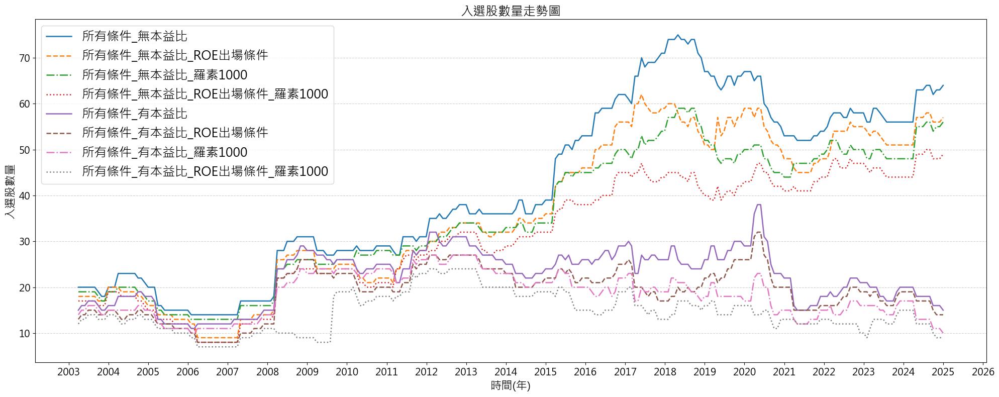

In [60]:
overall_russell_filt_collecs.plot_reps_stock_counts(['所有條件_無本益比', '所有條件_無本益比_ROE出場條件', '所有條件_無本益比_羅素1000', '所有條件_無本益比_ROE出場條件_羅素1000', '所有條件_有本益比', '所有條件_有本益比_ROE出場條件', '所有條件_有本益比_羅素1000', '所有條件_有本益比_ROE出場條件_羅素1000'])

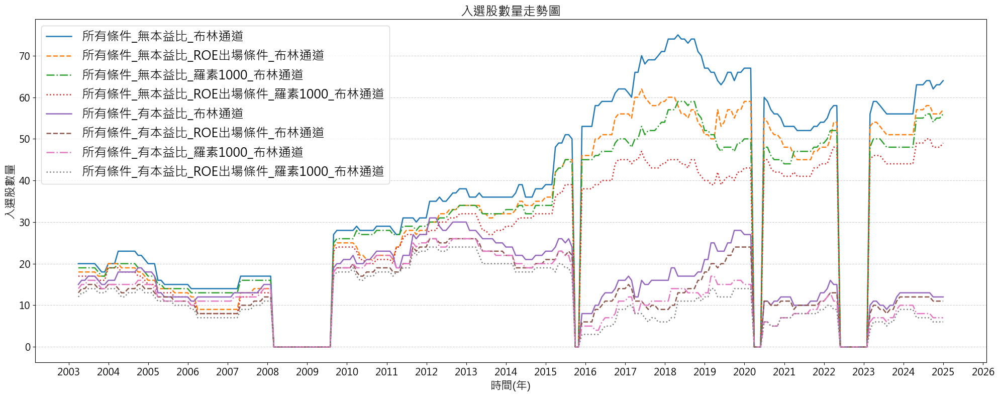

In [61]:
overall_russell_filt_collecs.plot_reps_stock_counts(['所有條件_無本益比_布林通道', '所有條件_無本益比_ROE出場條件_布林通道', '所有條件_無本益比_羅素1000_布林通道', '所有條件_無本益比_ROE出場條件_羅素1000_布林通道', '所有條件_有本益比_布林通道', '所有條件_有本益比_ROE出場條件_布林通道', '所有條件_有本益比_羅素1000_布林通道', '所有條件_有本益比_ROE出場條件_羅素1000_布林通道'])

Backtesting progress: 100%|██████████| 5/5 [00:08<00:00,  1.63s/condition]


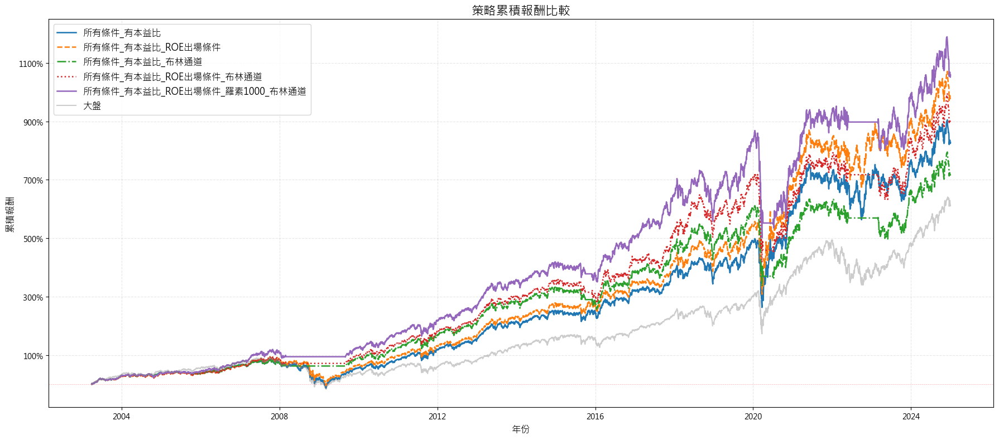

In [62]:
pe_russell_filt_conds = {}

pe_russell_filt_conds['所有條件_有本益比'] = orig_all_cond_and_pe_daily[START_DATE:END_DATE]
pe_russell_filt_conds['所有條件_有本益比_ROE出場條件'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15))
pe_russell_filt_conds['所有條件_有本益比_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | ~bolling_filt[START_DATE:END_DATE])
pe_russell_filt_conds['所有條件_有本益比_ROE出場條件_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15) | ~bolling_filt[START_DATE:END_DATE])
pe_russell_filt_conds['所有條件_有本益比_ROE出場條件_羅素1000_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE] & bolling_filt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 0.15) | ~bolling_filt[START_DATE:END_DATE])[filtered_russell_1000_symbol]

pe_russell_filt_collecs = sim_conditions(pe_russell_filt_conds, resample='ME', data=data)

pe_russell_filt_collecs.plot_strategies_cumm_return()

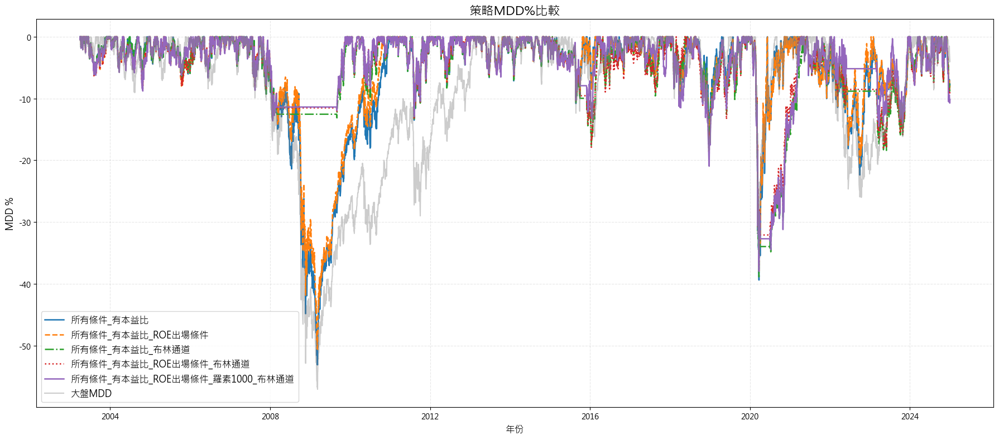

In [63]:
pe_russell_filt_collecs.plot_strategies_MDD()

---

## 不同換股頻率實驗

### 每季本益比

In [64]:
# 每年底 resample
pe_cond_entry_A = (pe < 12).resample('YE').last()[START_DATE:END_DATE]
pe_cond_exit_A = (pe > 30).resample('YE').last()[START_DATE:END_DATE]
all_cond_A = orig_all_cond.resample('YE').last()[START_DATE:END_DATE]

all_cond_pe_A = (all_cond_A & pe_cond_entry_A).hold_until(~all_cond_A | pe_cond_exit_A)
all_cond_pe_A_rep = backtest.sim(all_cond_pe_A, resample='YE', data=data)

# 每年三月底 resample
pe_cond_entry_AMAR = (pe < 12).resample('YE-MAR').last()[START_DATE:END_DATE]
pe_cond_exit_AMAR = (pe > 30).resample('YE-MAR').last()[START_DATE:END_DATE]
all_cond_AMAR = orig_all_cond.resample('YE-MAR').last()[START_DATE:END_DATE]

all_cond_pe_AMAR = (all_cond_AMAR & pe_cond_entry_AMAR).hold_until(~all_cond_AMAR | pe_cond_exit_AMAR)
all_cond_pe_AMAR_rep = backtest.sim(all_cond_pe_AMAR, resample='YE-MAR', data=data)

# 三月底 + 15天
all_cond_pe_AMAR15_rep = backtest.sim(all_cond_pe_AMAR, resample='YE-MAR', resample_offset='15D', data=data)

# 每季 resample
pe_cond_entry_Q = (pe < 12).resample('QE').last()[START_DATE:END_DATE]
pe_cond_exit_Q = (pe > 30).resample('QE').last()[START_DATE:END_DATE]
all_cond_Q = orig_all_cond.resample('QE').last()[START_DATE:END_DATE]

all_cond_pe_Q = (all_cond_Q & pe_cond_entry_Q).hold_until(~all_cond_Q| pe_cond_exit_Q )
all_cond_pe_Q_rep = backtest.sim(all_cond_pe_Q, resample='QE', data=data)

# 每月月初 resample
pe_cond_entry_MS = (pe < 12).resample('MS').first()[START_DATE:END_DATE]
pe_cond_exit_MS = (pe > 30).resample('MS').first()[START_DATE:END_DATE]
all_cond_MS = orig_all_cond.resample('MS').first()[START_DATE:END_DATE]

all_cond_pe_MS = (all_cond_MS & pe_cond_entry_MS).hold_until(~all_cond_MS | pe_cond_exit_MS)
all_cond_pe_MS_rep = backtest.sim(all_cond_pe_MS, resample='MS', data=data)

all_cond_pe_M15_rep = backtest.sim(all_cond_pe_MS, resample='MS', resample_offset='15D', data=data)

# # 每月月底 resample
# # pe_cond_entry_M = (pe < 12).resample('ME').last()[START_DATE:END_DATE]
# # pe_cond_exit_M = (pe > 30).resample('ME').last()[START_DATE:END_DATE]

# all_cond_pe_M = (orig_all_cond & pe_entry).hold_until(~orig_all_cond | pe_exit)
# all_cond_pe_M_rep = backtest.sim(all_cond_pe_M, resample='ME', data=data)

In [65]:
# # 每月月初 resample
# pe_cond_entry_MS = (pe < 12).resample('MS').first()[START_DATE:END_DATE]
# pe_cond_exit_MS = (pe > 30).resample('MS').first()[START_DATE:END_DATE]

all_cond_pe_MS_rep = backtest.sim(orig_all_cond_and_pe, resample='MS', data=data)

all_cond_pe_M15_rep = backtest.sim(orig_all_cond_and_pe, resample='MS', resample_offset='15D', data=data)

# # 每月月底 resample
# pe_cond_entry_M = (pe < 12).resample('ME').last()[START_DATE:END_DATE]
# pe_cond_exit_M = (pe > 30).resample('ME').last()[START_DATE:END_DATE]

all_cond_pe_M_rep = backtest.sim(orig_all_cond_and_pe, resample='ME', data=data)

# # 每日 resample
# pe_cond_entry_D = (pe < 12).resample('D').last()[START_DATE:END_DATE]
# pe_cond_exit_D = (pe > 30).resample('D').last()[START_DATE:END_DATE]

all_cond_pe_D_rep = backtest.sim(orig_all_cond_and_pe, resample='D', data=data)

In [66]:
# # 每兩週 resample
# pe_cond_entry_2W = (pe < 12).resample('2W').last()[START_DATE:END_DATE]
# pe_cond_exit_2W = (pe > 30).resample('2W').last()[START_DATE:END_DATE]

all_cond_pe_2W_rep = backtest.sim(orig_all_cond_and_pe, resample='2W', data=data)

# # 每周 resample
# pe_cond_entry_W = (pe < 12).resample('W').last()[START_DATE:END_DATE]
# pe_cond_exit_W = (pe > 30).resample('W').last()[START_DATE:END_DATE]

all_cond_pe_W_rep = backtest.sim(orig_all_cond_and_pe, resample='W', data=data)

In [67]:
print(f"每年\n{all_cond_pe_A_rep.get_stats()}")
print(f"每年三月底\n{all_cond_pe_AMAR_rep.get_stats()}")
print(f"每季\n{all_cond_pe_Q_rep.get_stats()}")
print(f"每月月初\n{all_cond_pe_MS_rep.get_stats()}")
print(f"每月月中\n{all_cond_pe_M15_rep.get_stats()}")
print(f"每月月底\n{all_cond_pe_M_rep.get_stats()}")
print(f"每兩週\n{all_cond_pe_2W_rep.get_stats()}")
print(f"每周\n{all_cond_pe_W_rep.get_stats()}")
print(f"每日\n{all_cond_pe_D_rep.get_stats()}")

每年
{'CAGR': 0.07297188319991177, 'daily_sharpe': 30.85, 'max_drawdown': -0.5859339659097078, 'avg_drawdown': -0.09477129959510396, 'win_ratio': 0.6129032258064516, 'ytd': 0.14331963408802273}
每年三月底
{'CAGR': 0.12570395325692418, 'daily_sharpe': 21.98, 'max_drawdown': -0.5165538843206717, 'avg_drawdown': -0.0613117025888602, 'win_ratio': 0.7636363636363637, 'ytd': 0.09556805483957143}
每季
{'CAGR': 0.11441779536451624, 'daily_sharpe': 24.19, 'max_drawdown': -0.5706240684677851, 'avg_drawdown': -0.0599631388490003, 'win_ratio': 0.6384180790960452, 'ytd': 0.10567316434970064}
每月月初
{'CAGR': 0.11268130798626541, 'daily_sharpe': 23.9, 'max_drawdown': -0.5767293644712688, 'avg_drawdown': -0.05458108755437182, 'win_ratio': 0.66, 'ytd': 0.06275348439335149}
每月月中
{'CAGR': 0.11240762245221281, 'daily_sharpe': 23.85, 'max_drawdown': -0.5840210963219423, 'avg_drawdown': -0.05530780193814367, 'win_ratio': 0.6600985221674877, 'ytd': 0.0597354876768188}
每月月底
{'CAGR': 0.11281952073687784, 'daily_sharpe': 

In [68]:
# orig_all_cond_pe_A_rep.display()

In [69]:
# orig_all_cond_pe_A_rep.display()

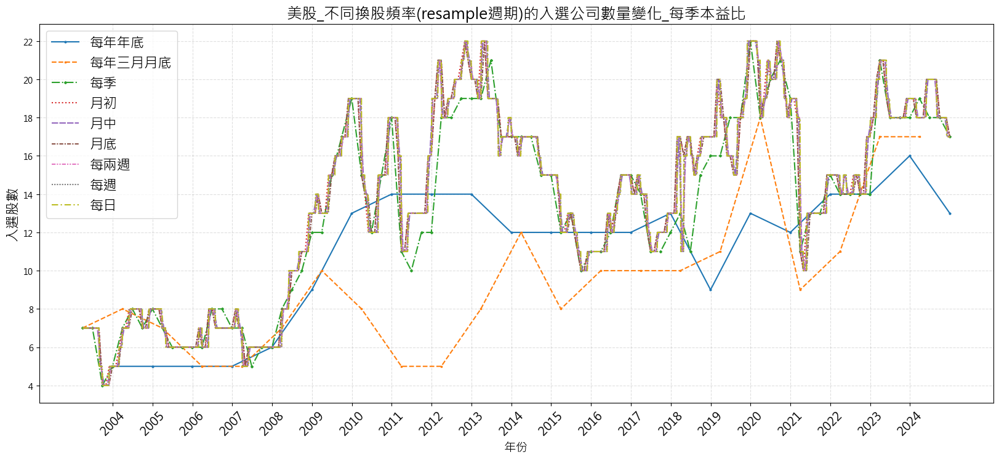

In [129]:
import matplotlib.ticker as ticker

data_series = {
    '每年年底': all_cond_pe_A_rep.stock_data['company_count'].dropna(),
    '每年三月月底': all_cond_pe_AMAR_rep.stock_data['company_count'].dropna(),
    '每季': all_cond_pe_Q_rep.stock_data['company_count'].dropna(),
    '月初': all_cond_pe_MS_rep.stock_data['company_count'].dropna(),
    '月中': all_cond_pe_M15_rep.stock_data['company_count'].dropna(),
    '月底': all_cond_pe_M_rep.stock_data['company_count'].dropna(),
    '每兩週': all_cond_pe_2W_rep.stock_data['company_count'].dropna(),
    '每週': all_cond_pe_W_rep.stock_data['company_count'].dropna(),
    '每日': all_cond_pe_D_rep.stock_data['company_count']
}

# 定義不同的 linestyle
linestyles = ['-', '--', '-.', ':', (0, (5, 1)), (0, (3, 1, 1, 1)), (0, (3, 1, 1, 1, 1, 1)), (0, (1, 1)), (0, (5, 2, 1, 2))]
markers = ['o', 's', 'D', '', '', '', '', '', '']

plt.figure(figsize=(20, 8))

for (label, series), linestyle, marker in zip(data_series.items(), linestyles, markers):
    plt.plot(series.index, series.values, linestyle=linestyle, label=label, marker=marker, markersize=2)

# 圖表設定
plt.title('美股_不同換股頻率(resample週期)的入選公司數量變化_每季本益比', fontsize=18)
plt.xlabel('年份', fontsize=14)
plt.ylabel('入選股數', fontsize=16)
plt.legend(fontsize=16)
plt.grid(True, linestyle='--', alpha=0.4)

# 設置 X 軸為每年年份
plt.xticks(
    ticks=pd.date_range(start=series.index.min(), end=series.index.max(), freq="YS"),
    labels=pd.date_range(start=series.index.min(), end=series.index.max(), freq="YS").strftime("%Y"),
    rotation=45,
    fontsize=14
)

# 設置 Y 軸為正整數
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

# 顯示圖表
plt.show()

In [71]:
print(f"每年年底\n入選股數平均：{round(all_cond_pe_A_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_A_rep.stock_data['company_count'].median()}, min: {all_cond_pe_A_rep.stock_data['company_count'].min()}, max: {all_cond_pe_A_rep.stock_data['company_count'].max()}")

print(f"每年三月底\n入選股數平均：{round(all_cond_pe_AMAR_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_AMAR_rep.stock_data['company_count'].median()}, min: {all_cond_pe_AMAR_rep.stock_data['company_count'].min()}, max: {all_cond_pe_AMAR_rep.stock_data['company_count'].max()}")

print(f"每年三月底 + 15天\n入選股數平均：{round(all_cond_pe_AMAR15_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_AMAR15_rep.stock_data['company_count'].median()}, min: {all_cond_pe_AMAR15_rep.stock_data['company_count'].min()}, max: {all_cond_pe_AMAR15_rep.stock_data['company_count'].max()}")

print(f"每季\n入選股數平均：{round(all_cond_pe_Q_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_Q_rep.stock_data['company_count'].median()}, min: {all_cond_pe_Q_rep.stock_data['company_count'].min()}, max: {all_cond_pe_Q_rep.stock_data['company_count'].max()}")

print(f"每月月初\n入選股數平均：{round(all_cond_pe_MS_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_MS_rep.stock_data['company_count'].median()}, min: {all_cond_pe_MS_rep.stock_data['company_count'].min()}, max: {all_cond_pe_MS_rep.stock_data['company_count'].max()}")

print(f"每月月中\n入選股數平均：{round(all_cond_pe_M15_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_M15_rep.stock_data['company_count'].median()}, min: {all_cond_pe_M15_rep.stock_data['company_count'].min()}, max: {all_cond_pe_M15_rep.stock_data['company_count'].max()}")

print(f"每月月底\n入選股數平均：{round(all_cond_pe_M_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_M_rep.stock_data['company_count'].median()}, min: {all_cond_pe_M_rep.stock_data['company_count'].min()}, max: {all_cond_pe_M_rep.stock_data['company_count'].max()}")

print(f"每兩週\n入選股數平均：{round(all_cond_pe_2W_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_2W_rep.stock_data['company_count'].median()}, min: {all_cond_pe_2W_rep.stock_data['company_count'].min()}, max: {all_cond_pe_2W_rep.stock_data['company_count'].max()}")

print(f"每周\n入選股數平均：{round(all_cond_pe_W_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_W_rep.stock_data['company_count'].median()}, min: {all_cond_pe_W_rep.stock_data['company_count'].min()}, max: {all_cond_pe_W_rep.stock_data['company_count'].max()}")

print(f"每日\n入選股數平均：{round(all_cond_pe_D_rep.stock_data['company_count'].mean(), 2)}中位數：{all_cond_pe_D_rep.stock_data['company_count'].median()}, min: {all_cond_pe_D_rep.stock_data['company_count'].min()}, max: {all_cond_pe_D_rep.stock_data['company_count'].max()}")

每年年底
入選股數平均：11.0中位數：12.0, min: 5.0, max: 16.0
每年三月底
入選股數平均：9.45中位數：8.5, min: 5.0, max: 18.0
每年三月底 + 15天
入選股數平均：10.14中位數：9.5, min: 5.0, max: 18.0
每季
入選股數平均：13.17中位數：13.5, min: 4.0, max: 22.0
每月月初
入選股數平均：13.73中位數：15.0, min: 4.0, max: 22.0
每月月中
入選股數平均：13.69中位數：14.0, min: 4.0, max: 22.0
每月月底
入選股數平均：13.68中位數：14.0, min: 4.0, max: 22.0
每兩週
入選股數平均：13.69中位數：14.0, min: 4.0, max: 22.0
每周
入選股數平均：13.67中位數：14.0, min: 4.0, max: 22.0
每日
入選股數平均：13.67中位數：14.0, min: 4, max: 22


### reports

In [72]:
# orig_all_cond_pe_A_rep.display()
# orig_all_cond_pe_Q_rep.display()
# orig_all_cond_pe_MS_rep.display()
# orig_all_cond_pe_M15_rep.display()
# orig_all_cond_pe_M_rep.display()
# orig_all_cond_pe_2W_rep.display()
# orig_all_cond_pe_W_rep.display()
# orig_all_cond_pe_D_rep.display()

In [73]:
### 

### 每日本益比

In [74]:
# 每年底 resample
daily_pe_entry_A = (pe_daily < 12).resample('YE').last()[START_DATE:END_DATE]
daily_pe_exit_A = (pe_daily > 30).resample('YE').last()[START_DATE:END_DATE]

orig_daily_pe_A = (all_cond_A & daily_pe_entry_A).hold_until(~all_cond_A | daily_pe_exit_A)
orig_daily_pe_A_rep = backtest.sim(orig_daily_pe_A, resample='YE', data=data)

# 每年三月底 resample
daily_pe_entry_AMAR = (pe_daily < 12).resample('YE-MAR').last()[START_DATE:END_DATE]
daily_pe_exit_AMAR = (pe_daily > 30).resample('YE-MAR').last()[START_DATE:END_DATE]

orig_daily_pe_AMAR = (all_cond_AMAR & daily_pe_entry_AMAR).hold_until(~all_cond_AMAR | daily_pe_exit_AMAR)
orig_daily_pe_AMAR_rep = backtest.sim(orig_daily_pe_AMAR, resample='YE-MAR', data=data)

# # 每季 resample
daily_pe_entry_Q = (pe_daily < 12).resample('QE').last()[START_DATE:END_DATE]
daily_pe_exit_Q = (pe_daily > 30).resample('QE').last()[START_DATE:END_DATE]

orig_daily_pe_Q = (all_cond_Q & daily_pe_entry_Q).hold_until(~all_cond_Q | daily_pe_exit_Q)
orig_daily_pe_Q_rep = backtest.sim(orig_daily_pe_Q, resample='QE', data=data)

In [ ]:
# 每月月初 resample
daily_pe_entry_MS = (pe_daily < 12).resample('MS').first()[START_DATE:END_DATE]
daily_pe_exit_MS = (pe_daily > 30).resample('MS').first()[START_DATE:END_DATE]

orig_daily_pe_MS = (all_cond_MS & daily_pe_entry_MS).hold_until(~all_cond_MS | daily_pe_exit_MS)
orig_daily_pe_MS_rep = backtest.sim(orig_daily_pe_MS, resample='MS', data=data)

# 每月月中 resample
orig_daily_pe_M15_rep = backtest.sim(orig_daily_pe_MS, resample='MS', resample_offset='15D', data=data)

# 每月月底 resample
orig_daily_pe_M_rep = backtest.sim(orig_all_cond_and_pe_daily, resample='ME', data=data)

# 每兩週 resample
daily_pe_entry_2W = (pe_daily < 12).resample('2W').last()[START_DATE:END_DATE]
daily_pe_exit_2W = (pe_daily > 30).resample('2W').last()[START_DATE:END_DATE]

orig_daily_pe_2W = (orig_all_cond & daily_pe_entry_2W).hold_until(~orig_all_cond | daily_pe_exit_2W)
orig_daily_pe_2W_rep = backtest.sim(orig_daily_pe_2W, resample='2W', data=data)

# 每周 resample
daily_pe_entry_W = (pe_daily < 12).resample('W').last()[START_DATE:END_DATE]
daily_pe_exit_W = (pe_daily> 30).resample('W').last()[START_DATE:END_DATE]

orig_daily_pe_W = (orig_all_cond & daily_pe_entry_W).hold_until(~orig_all_cond | daily_pe_exit_W)
orig_daily_pe_W_rep = backtest.sim(orig_daily_pe_W, resample='W', data=data)

In [116]:
# 每日 resample

orig_daily_pe_D = (orig_all_cond & (pe_daily < 12)).hold_until(~orig_all_cond | (pe_daily> 30))
orig_daily_pe_D_rep = backtest.sim(orig_daily_pe_D, resample='D', data=data)

In [76]:
# orig_daily_pe_W_rep.plot_company_counts()

In [118]:
print(f"每年\n{orig_daily_pe_A_rep.get_stats()}")
print(f"每年三月底\n{orig_daily_pe_AMAR_rep.get_stats()}")
print(f"每季\n{orig_daily_pe_Q_rep.get_stats()}")
print(f"每月月初\n{orig_daily_pe_MS_rep.get_stats()}")
print(f"每月月中\n{orig_daily_pe_M15_rep.get_stats()}")
print(f"每月月底\n{orig_daily_pe_M_rep.get_stats()}")
print(f"每兩週\n{orig_daily_pe_2W_rep.get_stats()}")
print(f"每周\n{orig_daily_pe_W_rep.get_stats()}")
print(f"每日\n{orig_daily_pe_D_rep.get_stats()}")

每年
{'CAGR': 0.09255724356383288, 'daily_sharpe': 26.34, 'max_drawdown': -0.5080601638249558, 'avg_drawdown': -0.05368152117553196, 'win_ratio': 0.696969696969697, 'ytd': 0.12324665472005658}
每年三月底
{'CAGR': 0.11334443639919578, 'daily_sharpe': 23.54, 'max_drawdown': -0.5503740067894125, 'avg_drawdown': -0.06819798929306992, 'win_ratio': 0.6697247706422018, 'ytd': 0.19445862730121566}
每季
{'CAGR': 0.1067956860685293, 'daily_sharpe': 24.78, 'max_drawdown': -0.5187415221071764, 'avg_drawdown': -0.05962850569846297, 'win_ratio': 0.6751592356687898, 'ytd': 0.06972819304248001}
每月月初
{'CAGR': 0.1077007018556142, 'daily_sharpe': 23.46, 'max_drawdown': -0.5281110837420913, 'avg_drawdown': -0.05624677863192867, 'win_ratio': 0.7125748502994012, 'ytd': 0.0757848742414422}
每月月中
{'CAGR': 0.10420617440406899, 'daily_sharpe': 24.58, 'max_drawdown': -0.5272908665282263, 'avg_drawdown': -0.05700891235845505, 'win_ratio': 0.686046511627907, 'ytd': 0.07329515975606271}
每月月底
{'CAGR': 0.10783361381834489, 'da

In [119]:
print(f"每年年底\n入選股數平均:{round(orig_daily_pe_A_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_A_rep.stock_data['company_count'].dropna().median()}")
print(f"每年三月月底\n入選股數平均:{round(orig_daily_pe_AMAR_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_AMAR_rep.stock_data['company_count'].dropna().median()}")
print(f"每季\n入選股數平均:{round(orig_daily_pe_Q_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_Q_rep.stock_data['company_count'].dropna().median()}")
print(f"每月月初\n入選股數平均:{round(orig_daily_pe_MS_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_MS_rep.stock_data['company_count'].dropna().median()}")
print(f"每月月中\n入選股數平均:{round(orig_daily_pe_M15_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_M15_rep.stock_data['company_count'].dropna().median()}")
print(f"每月月底\n入選股數平均:{round(orig_daily_pe_M_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_M_rep.stock_data['company_count'].dropna().median()}")
print(f"每兩週\n入選股數平均:{round(orig_daily_pe_2W_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_2W_rep.stock_data['company_count'].dropna().median()}")
print(f"每周\n入選股數平均:{round(orig_daily_pe_W_rep.stock_data['company_count'].dropna().mean(), 2)}, 中位數:{orig_daily_pe_W_rep.stock_data['company_count'].dropna().median()}")
print(f"每日\n入選股數平均:{round(orig_daily_pe_D_rep.stock_data['company_count'].mean(), 2)}, 中位數:{orig_daily_pe_D_rep.stock_data['company_count'].median()}")

每年年底
入選股數平均:18.05, 中位數:16.5
每年三月月底
入選股數平均:19.05, 中位數:19.0
每季
入選股數平均:21.5, 中位數:24.0
每月月初
入選股數平均:22.36, 中位數:24.0
每月月中
入選股數平均:22.44, 中位數:24.0
每月月底
入選股數平均:22.28, 中位數:24.0
每兩週
入選股數平均:22.68, 中位數:24.0
每周
入選股數平均:22.8, 中位數:24.0
每日
入選股數平均:23.04, 中位數:24.0


In [121]:
orig_pe_M_stocklist = all_cond_pe_M_rep.trades.reset_index()['stock_id'].to_list()
orig_daily_pe_M_stocklist = orig_daily_pe_M_rep.trades.reset_index()['stock_id'].to_list()
orig_daily_pe_D_stocklist = orig_daily_pe_D_rep.trades.reset_index()['stock_id'].to_list()
orig_pe_D_stocklist = all_cond_pe_D_rep.trades.reset_index()['stock_id'].to_list()
orig_daily_pe_A_stocklist = orig_daily_pe_A_rep.trades.reset_index()['stock_id'].to_list()

# unique_stocks = set(orig_pe_M_stocklist).symmetric_difference(set(orig_daily_pe_M_stocklist))
# unique_stocks_list = list(unique_stocks)
# print(len(unique_stocks_list))

In [ ]:
only_in_daily_pe_M = set(orig_daily_pe_M_stocklist) - set(orig_pe_M_stocklist)
print("Stocks only in 每日本益比每月resample:", len(only_in_daily_pe_M))

only_in_pe_M = set(orig_pe_M_stocklist) - set(orig_daily_pe_M_stocklist)
print("Stocks only in 每季本益比每月resample:", len(only_in_pe_M))

only_in_daily_pe_D = set(orig_daily_pe_D_stocklist) - set(orig_pe_D_stocklist)
print("\n\nStocks only in 每日本益比每日resample:", len(only_in_daily_pe_D))

only_in_pe_D = set(orig_pe_D_stocklist) - set(orig_daily_pe_D_stocklist)
print("Stocks only in 每季本益比每日resample:", len(only_in_pe_D))

Stocks only in 每日本益比每月resample: 25
Stocks only in 每季本益比每月resample: 13


Stocks only in 每日本益比每日resample: 26
Stocks only in 每季本益比每日resample: 11
127


In [123]:
only_in_daily_pe_M = set(orig_daily_pe_M_stocklist) - set(orig_daily_pe_D_stocklist)
print("Stocks only in 每日本益比每月resample:", len(only_in_daily_pe_M))

only_in_daily_pe_D = set(orig_daily_pe_D_stocklist) - set(orig_daily_pe_M_stocklist)
print("Stocks only in 每日本益比每日resample:", len(only_in_daily_pe_D))

Stocks only in 每日本益比每月resample: 0
Stocks only in 每日本益比每日resample: 4


In [124]:
only_in_daily_pe_M = set(orig_daily_pe_M_stocklist) - set(orig_daily_pe_A_stocklist)
print("Stocks only in 每日本益比每月resample:", len(only_in_daily_pe_M))

only_in_daily_pe_A = set(orig_daily_pe_A_stocklist) - set(orig_daily_pe_M_stocklist)
print("Stocks only in 每日本益比每年resample:", len(only_in_daily_pe_A))

Stocks only in 每日本益比每月resample: 48
Stocks only in 每日本益比每年resample: 0


In [125]:
same_stocks = set(orig_pe_M_stocklist).intersection(set(orig_daily_pe_M_stocklist))
same_stocks_list = list(same_stocks)
print(len(same_stocks_list))

124


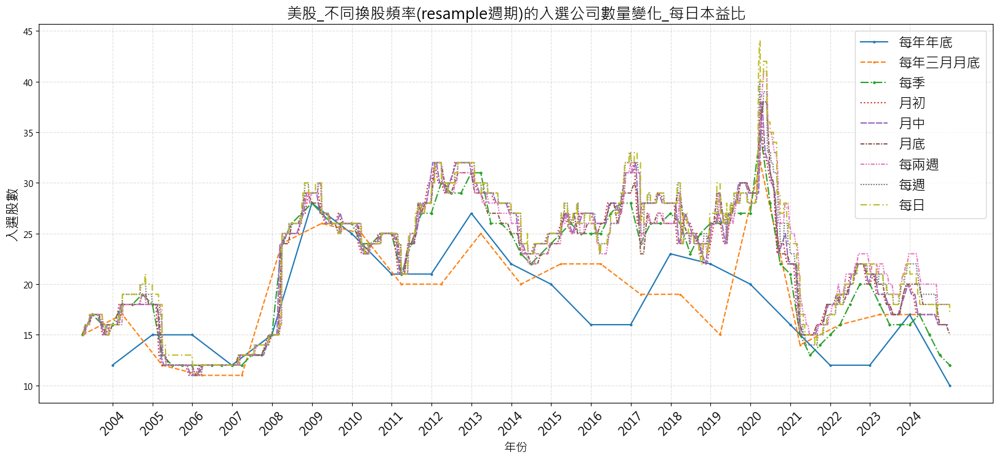

In [130]:
data_series_daily = {
    '每年年底': orig_daily_pe_A_rep.stock_data['company_count'].dropna(),
    # '每年三月月底_Q': orig_all_cond_pe_AMAR_rep.stock_data['company_count'].dropna(),
    '每年三月月底': orig_daily_pe_AMAR_rep.stock_data['company_count'].dropna(),
    '每季': orig_daily_pe_Q_rep.stock_data['company_count'].dropna(),
    '月初': orig_daily_pe_MS_rep.stock_data['company_count'].dropna(),
    '月中': orig_daily_pe_M15_rep.stock_data['company_count'].dropna(),
    # '月底_Q': orig_all_cond_pe_M_rep.stock_data['company_count'].dropna(),
    '月底': orig_daily_pe_M_rep.stock_data['company_count'].dropna(),
    '每兩週': orig_daily_pe_2W_rep.stock_data['company_count'].dropna(),
    '每週': orig_daily_pe_W_rep.stock_data['company_count'].dropna(),
    '每日': orig_daily_pe_D_rep.stock_data['company_count']
}

linestyles = ['-', '--', '-.', ':', (0, (5, 1)), (0, (3, 1, 1, 1)), (0, (3, 1, 1, 1, 1, 1)), (0, (1, 1)), (0, (5, 2, 1, 2))]
markers = ['o', 's', 'D', '', '', '', '', '', '']

plt.figure(figsize=(20, 8))

for (label, series), linestyle, marker in zip(data_series_daily.items(), linestyles, markers):
    plt.plot(series.index, series.values, linestyle=linestyle, label=label, marker=marker, markersize=2)

# 圖表設定
plt.title('美股_不同換股頻率(resample週期)的入選公司數量變化_每日本益比', fontsize=18)
plt.xlabel('年份', fontsize=14)
plt.ylabel('入選股數', fontsize=16)
plt.legend(fontsize=16)
plt.grid(True, linestyle='--', alpha=0.4)

# 設置 X 軸為每年年份
plt.xticks(
    ticks=pd.date_range(start=series.index.min(), end=series.index.max(), freq="YS"),
    labels=pd.date_range(start=series.index.min(), end=series.index.max(), freq="YS").strftime("%Y"),
    rotation=45,
    fontsize=14
)

# 顯示圖表
plt.show()

### reports

In [82]:
# orig_daily_pe_A_rep.display()
# orig_daily_pe_Q_rep.display()
# orig_daily_pe_MS_rep.display()
# orig_daily_pe_M15_rep.display()
# orig_daily_pe_M_rep.display()
# orig_daily_pe_2W_rep.display()
# orig_daily_pe_W_rep.display()
# orig_daily_pe_D_rep.display()

---

---

## 比較是否考慮某項條件其對績效的影響

In [83]:
dataframes = {
    'roe_15': roe_cond,
    'rr_cond': rr_cond,
    'payout_ratio_cond': payout_cond,
    'profit_cond': netprofit_cond,
    'listed': listed_cond,
}

# 定義 DataFrame 對應的中文名稱
dataframe_names = {
    'roe_15': 'ROE五年平均',
    'rr_cond': '盈再率',
    'payout_ratio_cond': '配息率',
    'profit_cond': '稅後淨利',
    'hold_cond': '董監持股',
    'listed': '上市櫃滿兩年'
}


# 用於儲存組合結果
compare_conds_strat = {}

# 產生不同長度的組合
counter = 1
for r in range(1, len(dataframes) + 1):
    for combination in itertools.combinations(dataframes.keys(), r):
        # 計算DataFrame間的 AND 運算
        combined_signal = dataframes[combination[0]]
        for df_name in combination[1:]:
            combined_signal &= dataframes[df_name]

        # 限制日期區間
        combined_signal = CustomDataFrame(combined_signal)
        combined_signal = combined_signal[START_DATE:END_DATE]

        # 使用組合的中文名稱生成key_name
        key_name = "+".join([dataframe_names[df] for df in combination])

        # 將計算結果儲存到字典
        compare_conds_strat[key_name] = combined_signal
        counter += 1




compare_strat_collecs = sim_conditions(compare_conds_strat, resample='ME', data=data)

Backtesting progress: 100%|██████████| 31/31 [10:27<00:00, 20.26s/condition]


In [84]:
compare_strat_collecs_df = compare_strat_collecs.selected_stock_count_analysis()
# compare_strat_collecs_df.to_csv('./performance_file/US/美股_比較是否考慮某項條件其對績效的影響_無本益比進出場.csv', encoding="cp950")

包含本益比進出場

In [85]:
# 用於儲存組合結果
compare_conds_strat_PE={}

# 產生不同長度的組合，從1到6
counter = 1
for r in range(1, len(dataframes) + 1):
    for combination in itertools.combinations(dataframes.keys(), r):
        # 計算DataFrame間的 AND 運算
        combined_signal = dataframes[combination[0]]
        for df_name in combination[1:]:
            combined_signal &= dataframes[df_name]

        # 限制日期區間
        combined_signal = CustomDataFrame(combined_signal)
        combined_signal = (combined_signal[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~combined_signal[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])

        # 使用組合的中文名稱生成key_name
        key_name = "+".join([dataframe_names[df] for df in combination])

        # 將計算結果儲存到字典
        compare_conds_strat_PE[key_name] = combined_signal
        counter += 1


compare_strat_collecs_PE = sim_conditions(compare_conds_strat_PE, resample='ME', data=data)

Backtesting progress: 100%|██████████| 31/31 [04:18<00:00,  8.33s/condition]


In [86]:
compare_strat_collecs_PE_df = compare_strat_collecs_PE.selected_stock_count_analysis()
# compare_strat_collecs_PE_df.to_csv('./performance_file/US/美股_比較是否考慮某項條件其對績效的影響_本益比進出場.csv', encoding="cp950")

---

In [87]:
# 條件的字典
condition_dict = {
    'ROE五年平均': roe_cond,
    '盈再率': rr_cond,
    '三年配息率': payout_cond,
    '稅後淨利': netprofit_cond,
    '上市櫃滿兩年': listed_cond,
}

# 分離 "董監持股+上市櫃滿兩年" 與其他條件
additional_condition_key = '上市櫃滿兩年'
additional_condition = condition_dict.pop(additional_condition_key)

# 剩餘條件的 key
keys = list(condition_dict.keys())

# 創建交易訊號字典
signal_dict = {}

# 遍歷 2, 3, 4 的組合長度
for r in range(2, 5):
    combinations = itertools.combinations(keys, r)
    for combo in combinations:
        # 組合名稱
        combo_name = '+'.join(combo)

        # 條件的 AND 結果
        combined_condition = condition_dict[combo[0]]
        for key in combo[1:]:
            combined_condition &= condition_dict[key]

        # 加入不含 "董監持股+上市櫃滿兩年" 的組合
        signal_dict[combo_name] = combined_condition[START_DATE:END_DATE]

        # 加入含 "董監持股+上市櫃滿兩年" 的組合
        combo_name_with_additional = f"{combo_name}_{additional_condition_key}"
        signal_dict[combo_name_with_additional] = (combined_condition & additional_condition)[START_DATE:END_DATE]

# 添加本益比進出場的組合
pe_signal_dict = {}
for name, sig in signal_dict.items():
    # 原組合的本益比進出場
    pe_signal_dict[f"{name}_本益比進出場"] = (sig[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~sig[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])

    # 含 "董監持股+上市櫃滿兩年" 的組合的本益比進出場
    if additional_condition_key in name:
        pe_signal_dict[f"{name}_本益比進出場"] = (sig[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~sig[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])

# 合併所有組合
signal_dict.update(pe_signal_dict)

# 確認結果
for name, condition in signal_dict.items():
    print(name)

ROE五年平均+盈再率
ROE五年平均+盈再率_上市櫃滿兩年
ROE五年平均+三年配息率
ROE五年平均+三年配息率_上市櫃滿兩年
ROE五年平均+稅後淨利
ROE五年平均+稅後淨利_上市櫃滿兩年
盈再率+三年配息率
盈再率+三年配息率_上市櫃滿兩年
盈再率+稅後淨利
盈再率+稅後淨利_上市櫃滿兩年
三年配息率+稅後淨利
三年配息率+稅後淨利_上市櫃滿兩年
ROE五年平均+盈再率+三年配息率
ROE五年平均+盈再率+三年配息率_上市櫃滿兩年
ROE五年平均+盈再率+稅後淨利
ROE五年平均+盈再率+稅後淨利_上市櫃滿兩年
ROE五年平均+三年配息率+稅後淨利
ROE五年平均+三年配息率+稅後淨利_上市櫃滿兩年
盈再率+三年配息率+稅後淨利
盈再率+三年配息率+稅後淨利_上市櫃滿兩年
ROE五年平均+盈再率+三年配息率+稅後淨利
ROE五年平均+盈再率+三年配息率+稅後淨利_上市櫃滿兩年
ROE五年平均+盈再率_本益比進出場
ROE五年平均+盈再率_上市櫃滿兩年_本益比進出場
ROE五年平均+三年配息率_本益比進出場
ROE五年平均+三年配息率_上市櫃滿兩年_本益比進出場
ROE五年平均+稅後淨利_本益比進出場
ROE五年平均+稅後淨利_上市櫃滿兩年_本益比進出場
盈再率+三年配息率_本益比進出場
盈再率+三年配息率_上市櫃滿兩年_本益比進出場
盈再率+稅後淨利_本益比進出場
盈再率+稅後淨利_上市櫃滿兩年_本益比進出場
三年配息率+稅後淨利_本益比進出場
三年配息率+稅後淨利_上市櫃滿兩年_本益比進出場
ROE五年平均+盈再率+三年配息率_本益比進出場
ROE五年平均+盈再率+三年配息率_上市櫃滿兩年_本益比進出場
ROE五年平均+盈再率+稅後淨利_本益比進出場
ROE五年平均+盈再率+稅後淨利_上市櫃滿兩年_本益比進出場
ROE五年平均+三年配息率+稅後淨利_本益比進出場
ROE五年平均+三年配息率+稅後淨利_上市櫃滿兩年_本益比進出場
盈再率+三年配息率+稅後淨利_本益比進出場
盈再率+三年配息率+稅後淨利_上市櫃滿兩年_本益比進出場
ROE五年平均+盈再率+三年配息率+稅後淨利_本益比進出場
ROE五年平均+盈再率+三年配息率+稅後淨利_上市櫃滿兩年_本益比進出場


In [88]:
signal_dict_comb = sim_conditions(signal_dict, resample='ME', data=data)
signal_dict_comb.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 44/44 [03:26<00:00,  4.68s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
ROE五年平均+盈再率,14.58,-51.87,295.56,293.0,259.00,353.75,179.0,447.0
ROE五年平均+盈再率_上市櫃滿兩年,14.36,-52.02,290.42,289.0,256.25,348.00,174.0,445.0
ROE五年平均+稅後淨利_本益比進出場,14.28,-55.49,208.76,212.0,196.00,227.00,115.0,292.0
ROE五年平均+盈再率_本益比進出場,13.64,-53.31,163.10,173.5,129.00,182.75,97.0,266.0
ROE五年平均+盈再率_上市櫃滿兩年_本益比進出場,13.57,-53.91,160.56,172.0,126.00,181.00,95.0,259.0
ROE五年平均+稅後淨利,13.47,-53.93,338.90,312.0,275.25,409.00,179.0,528.0
ROE五年平均+盈再率+稅後淨利,12.88,-52.45,238.37,221.0,196.00,304.00,111.0,388.0
ROE五年平均+盈再率+稅後淨利_上市櫃滿兩年,12.67,-52.79,234.71,218.0,194.00,298.75,109.0,386.0
ROE五年平均+稅後淨利_上市櫃滿兩年,12.65,-53.84,331.45,299.5,270.00,401.00,176.0,523.0


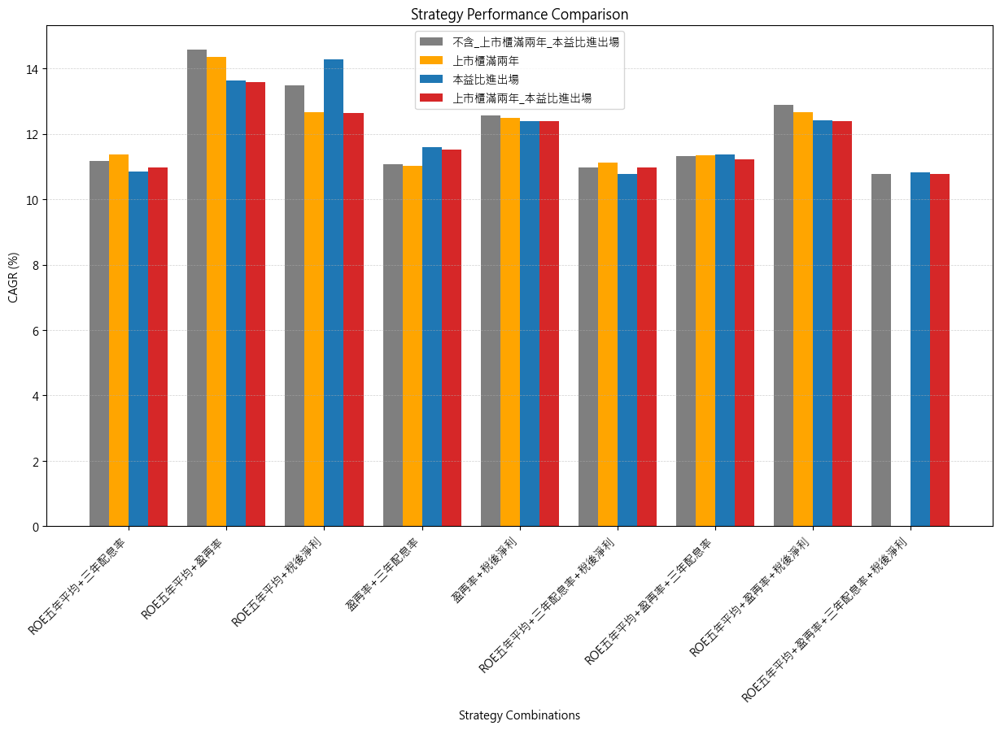

In [89]:
df = signal_dict_comb.selected_stock_count_analysis()
df.reset_index(inplace=True)

# 先找出基準策略的CAGR
baseline_strategy = "ROE五年平均+盈再率+三年配息率+稅後淨利_上市櫃滿兩年_本益比進出場"
baseline_cagr = df.loc[df['Strategy'] == baseline_strategy, 'CAGR (%)'].values[0]

# 找出所有績效較好的策略
better_strategies = df[df['CAGR (%)'] >= baseline_cagr].copy()

# 處理Strategy名稱，分離因子組合和後綴
def process_strategy(strategy):
    # 分離後綴
    suffixes = []
    if '_上市櫃滿兩年_本益比進出場' in strategy:
        base = strategy.replace('_上市櫃滿兩年_本益比進出場', '')
        suffix_type = 'both'
    elif '_上市櫃滿兩年' in strategy:
        base = strategy.replace('_上市櫃滿兩年', '')
        suffix_type = 'listed'
    elif '_本益比進出場' in strategy:
        base = strategy.replace('_本益比進出場', '')
        suffix_type = 'pe'
    else:
        base = strategy
        suffix_type = 'none'
    
    # 計算因子數量
    factor_count = len(base.split('+'))
    
    return pd.Series({
        'base_strategy': base,
        'suffix_type': suffix_type,
        'factor_count': factor_count
    })

# 添加處理後的列
better_strategies = pd.concat([
    better_strategies,
    better_strategies['Strategy'].apply(process_strategy)
], axis=1)

# 排序資料
better_strategies = better_strategies.sort_values(['factor_count', 'base_strategy', 'suffix_type'])

# 設定圖表樣式
# plt.style.use('seaborn')
plt.figure(figsize=(15, 8))

# 設定bar的寬度和位置
bar_width = 0.2
suffix_types = ['none', 'listed', 'pe', 'both']
colors = ['tab:gray', 'orange', 'tab:blue', 'tab:red']
positions = np.arange(len(better_strategies['base_strategy'].unique()))

# 繪製grouped bar chart
for i, (suffix, color) in enumerate(zip(suffix_types, colors)):
    mask = better_strategies['suffix_type'] == suffix
    strat_data = better_strategies[mask].set_index('base_strategy')['CAGR (%)']
    plt.bar(positions + i * bar_width, 
            [strat_data.get(strategy, 0) for strategy in better_strategies['base_strategy'].unique()],
            bar_width,
            label=suffix,
            color=color)

# 設定圖表標籤
plt.xlabel('Strategy Combinations')
plt.ylabel('CAGR (%)')
plt.title('Strategy Performance Comparison')
plt.xticks(positions + bar_width * 1.5, 
          better_strategies['base_strategy'].unique(), 
          rotation=45,
          ha='right')

# 添加圖例
plt.legend(['不含_上市櫃滿兩年_本益比進出場', 
            '上市櫃滿兩年', 
            '本益比進出場', 
            '上市櫃滿兩年_本益比進出場'])

plt.grid(axis='y', linestyle='--', linewidth=0.5, alpha=0.6)

# # 調整版面
# plt.tight_layout()

# 顯示圖表
plt.show()

In [90]:
pd.options.display.float_format = '{:.2f}'.format


def analyze_signal_groups(signal_dict_comb):
    # 初始化結果字典
    results = {
        '包含ROE五年平均': [],
        '包含盈再率': [],
        '包含配息率': [],
        '包含稅後淨利': [],
        # '包含董監持股+上市櫃滿兩年': []
    }

    # 遍歷策略並分類
    for strategy in signal_dict_comb.index:
        if 'ROE五年平均' in strategy:
            results['包含ROE五年平均'].append(strategy)
        if '盈再率' in strategy:
            results['包含盈再率'].append(strategy)
        if '三年配息率' in strategy:
            results['包含配息率'].append(strategy)
        if '稅後淨利' in strategy:
            results['包含稅後淨利'].append(strategy)
        # if '董監持股+上市櫃滿兩年' in strategy:
        #     results['包含董監持股+上市櫃滿兩年'].append(strategy)

    # 計算每組的平均值，細分為包含/不包含條件、有/無本益比進出場、綜合
    summary_data = []
    for group, strategies in results.items():
        condition_name = group.split('包含')[1]

        # 包含條件與不包含條件
        for include_condition in [True, False]:
            filtered_strategies_condition = [s for s in signal_dict_comb.index if (condition_name in s) == include_condition]

            # 細分有/無本益比進出場
            for include_pe in [True, False]:
                filtered_strategies = [s for s in filtered_strategies_condition if ('本益比進出場' in s) == include_pe]
                if filtered_strategies:
                    filtered_df = signal_dict_comb.loc[filtered_strategies]
                    avg_cagr = filtered_df['CAGR (%)'].mean()
                    avg_mdd = filtered_df['MDD (%)'].mean()
                    avg_selected_stock = filtered_df['入選股數平均'].mean()
                    condition_label = f"{'包含' if include_condition else '不包含'}{condition_name} ({'含本益比進出場' if include_pe else '不含本益比進出場'})"
                    summary_data.append([condition_label, avg_cagr, avg_mdd, avg_selected_stock])

            # 綜合分析
            combined_df = signal_dict_comb.loc[filtered_strategies_condition]
            if not combined_df.empty:
                avg_cagr_combined = combined_df['CAGR (%)'].mean()
                avg_mdd_combined = combined_df['MDD (%)'].mean()
                avg_selected_stock_combined = combined_df['入選股數平均'].mean()
                condition_label = f"{'包含' if include_condition else '不包含'}{condition_name} (綜合)"
                summary_data.append([condition_label, avg_cagr_combined, avg_mdd_combined, avg_selected_stock_combined])

    # 返回新的 DataFrame
    summary_df = pd.DataFrame(summary_data, columns=['Group', 'Average CAGR (%)', 'Average MDD (%)', 'Average Selected Stock Count'])
    return summary_df

# signal_dict_comb = sim_conditions(signal_dict, resample='ME', data=data)
summary_df = analyze_signal_groups(signal_dict_comb.selected_stock_count_analysis())
summary_df

,Group,Average CAGR (%),Average MDD (%),Average Selected Stock Count
0,包含ROE五年平均 (含本益比進出場),11.91,-53.03,89.07
1,包含ROE五年平均 (不含本益比進出場),12.10,-51.80,154.56
2,包含ROE五年平均 (綜合),12.00,-52.42,121.82
3,不包含ROE五年平均 (含本益比進出場),11.21,-53.92,119.96
4,不包含ROE五年平均 (不含本益比進出場),10.89,-53.77,211.65
5,不包含ROE五年平均 (綜合),11.05,-53.84,165.80
6,包含盈再率 (含本益比進出場),11.81,-52.76,103.94
7,包含盈再率 (不含本益比進出場),11.85,-51.91,186.20
8,包含盈再率 (綜合),11.83,-52.33,145.07
9,不包含盈再率 (含本益比進出場),11.38,-54.40,93.93


### 繪圖

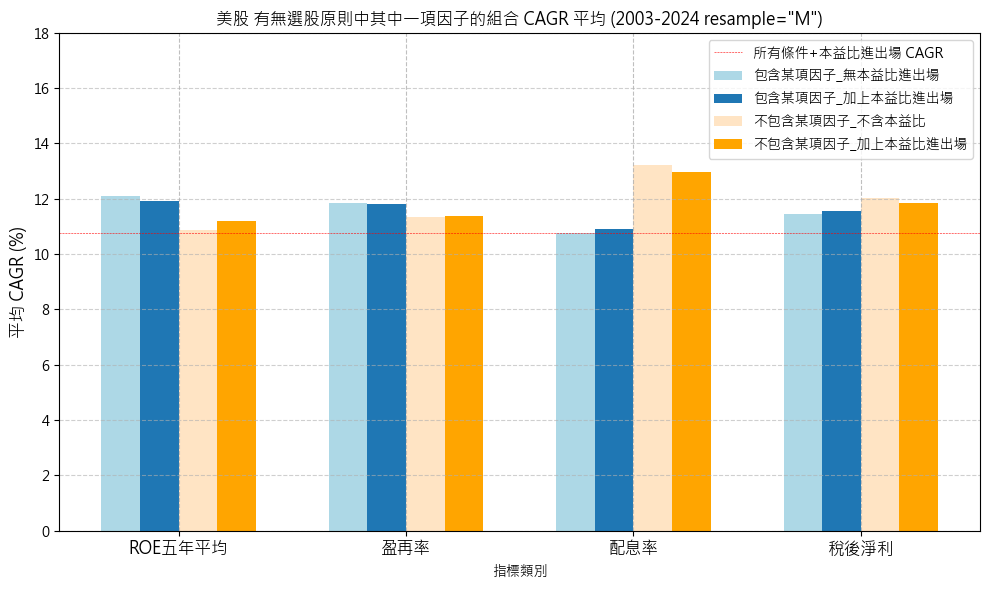

In [91]:
# 創建DataFrame
df = summary_df.copy()

# # 處理數據：提取所需的行（包含/不包含且是含本益比進出場的組合）
# mask = df['Group'].str.contains('含本益比進出場')
# filtered_df = df[mask].copy()

# # 定義類別順序
# categories = ['ROE五年平均', '盈再率', '配息率', '稅後淨利']

# # 創建類別對應的數據
# included_values = []
# excluded_values = []

# for category in categories:
#     # 獲取包含該類別的資料
#     included_mask = filtered_df['Group'].str.contains(f'包含{category}')
#     excluded_mask = filtered_df['Group'].str.contains(f'不包含{category}')
    
#     included_value = filtered_df[included_mask]['Average CAGR (%)'].values[0]
#     excluded_value = filtered_df[excluded_mask]['Average CAGR (%)'].values[0]
    
#     included_values.append(included_value)
#     excluded_values.append(excluded_value)

# # 設置圖表風格和大小
# # plt.style.use('seaborn')
# plt.figure(figsize=(14, 6))

# # 設置bar的寬度
# width = 0.17

# # 設置x軸位置
# x = np.arange(len(categories))

# # 繪製條形圖
# bars1 = plt.bar(x - width/2, included_values, width, label='包含', color='tab:blue')
# bars2 = plt.bar(x + width/2, excluded_values, width, label='不包含', color='orange')

# # 設置圖表標題和標籤
# plt.title('台股 有無選股原則中其中一項因子的組合 CAGR 平均 (含本益比進出場)', fontsize=12)
# plt.xlabel('指標類別')
# plt.ylabel('Average CAGR (%)')

# # 設置x軸刻度和標籤
# plt.xticks(x, categories)

# # 設置y軸範圍
# plt.ylim(0, 16)

# # 添加網格線
# plt.grid(True, linestyle='--', alpha=0.8)

# benchmark_value = signal_dict_comb.selected_stock_count_analysis().loc['ROE五年平均+盈再率+三年配息率+稅後淨利_董監持股+上市櫃滿兩年_本益比進出場']['CAGR (%)']
# plt.axhline(y=benchmark_value, color='red', linestyle='--', label='所有條件+本益比進出場 CAGR', linewidth=0.3)

# # 添加圖例
# plt.legend(loc='upper center', bbox_to_anchor=(1.15, 1), fontsize=10)

# # 調整布局
# plt.tight_layout()

# # 顯示圖表
# plt.show()

# 定義類別順序
categories = ['ROE五年平均', '盈再率', '配息率', '稅後淨利']

# 創建類別對應的數據
included_no_pe_values = []  # 包含但不含本益比
included_with_pe_values = []  # 包含且含本益比
excluded_no_pe_values = []  # 不包含且不含本益比
excluded_with_pe_values = []  # 不包含且含本益比

for category in categories:
    # 包含且不含本益比
    mask_included_no_pe = df['Group'].str.contains(f'包含{category} \(不含本益比進出場\)')
    included_no_pe_values.append(df[mask_included_no_pe]['Average CAGR (%)'].values[0])
    
    # 包含且含本益比
    mask_included_with_pe = df['Group'].str.contains(f'包含{category} \(含本益比進出場\)')
    included_with_pe_values.append(df[mask_included_with_pe]['Average CAGR (%)'].values[0])
    
    # 不包含且不含本益比
    mask_excluded_no_pe = df['Group'].str.contains(f'不包含{category} \(不含本益比進出場\)')
    excluded_no_pe_values.append(df[mask_excluded_no_pe]['Average CAGR (%)'].values[0])
    
    # 不包含且含本益比
    mask_excluded_with_pe = df['Group'].str.contains(f'不包含{category} \(含本益比進出場\)')
    excluded_with_pe_values.append(df[mask_excluded_with_pe]['Average CAGR (%)'].values[0])

# 設置圖表大小
plt.figure(figsize=(10, 6))

# 設置bar的寬度
width = 0.17

# 設置x軸位置
x = np.arange(len(categories))

# 繪製條形圖
bars1 = plt.bar(x - width*1.5, included_no_pe_values, width, 
                label='包含某項因子_無本益比進出場', color='lightblue')
bars2 = plt.bar(x - width/2, included_with_pe_values, width, 
                label='包含某項因子_加上本益比進出場', color='tab:blue')
bars3 = plt.bar(x + width/2, excluded_no_pe_values, width, 
                label='不包含某項因子_不含本益比', color='bisque')
bars4 = plt.bar(x + width*1.5, excluded_with_pe_values, width, 
                label='不包含某項因子_加上本益比進出場', color='orange')

# 設置圖表標題和標籤
plt.title('美股 有無選股原則中其中一項因子的組合 CAGR 平均 (2003-2024 resample="M")', fontsize=12)
plt.xlabel('指標類別')
plt.ylabel('平均 CAGR (%)', fontsize=12)

# 設置x軸刻度和標籤
plt.xticks(x, categories, fontsize=12)

# 設置y軸範圍
plt.ylim(0, 18)

# # 添加網格線
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.grid(axis='x', linestyle='--', alpha=0.8)

# 添加基準線
benchmark_value = signal_dict_comb.selected_stock_count_analysis().loc['ROE五年平均+盈再率+三年配息率+稅後淨利_上市櫃滿兩年_本益比進出場']['CAGR (%)']
plt.axhline(y=benchmark_value, color='red', linestyle='--', 
            label='所有條件+本益比進出場 CAGR', linewidth=0.4)

# # 在bar上添加數值標籤
# def add_value_labels(bars):
#     for bar in bars:
#         height = bar.get_height()
#         plt.text(bar.get_x() + bar.get_width()/2., height,
#                 f'{height:.2f}%',
#                 ha='center', va='bottom',
#                 fontsize=8)

# add_value_labels(bars1)
# add_value_labels(bars2)
# add_value_labels(bars3)
# add_value_labels(bars4)

# 添加圖例
plt.legend()

# 調整布局
plt.tight_layout()

# 顯示圖表
plt.show()

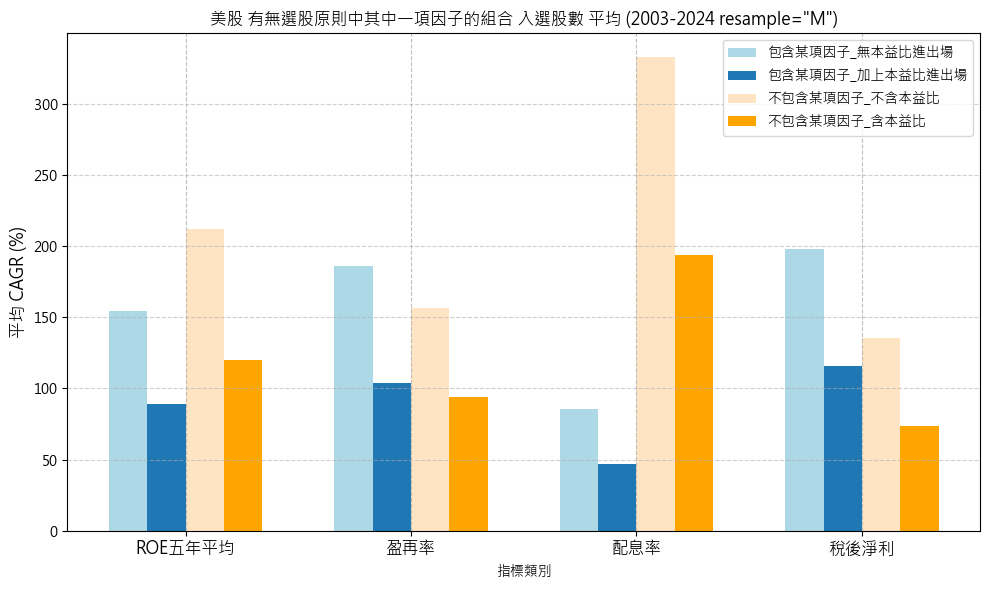

In [92]:
# 創建DataFrame
df = summary_df.copy()


# 定義類別順序
categories = ['ROE五年平均', '盈再率', '配息率', '稅後淨利']

# 創建類別對應的數據
included_no_pe_values = []  # 包含但不含本益比
included_with_pe_values = []  # 包含且含本益比
excluded_no_pe_values = []  # 不包含且不含本益比
excluded_with_pe_values = []  # 不包含且含本益比

for category in categories:
    # 包含且不含本益比
    mask_included_no_pe = df['Group'].str.contains(f'包含{category} \(不含本益比進出場\)')
    included_no_pe_values.append(df[mask_included_no_pe]['Average Selected Stock Count'].values[0])
    
    # 包含且含本益比
    mask_included_with_pe = df['Group'].str.contains(f'包含{category} \(含本益比進出場\)')
    included_with_pe_values.append(df[mask_included_with_pe]['Average Selected Stock Count'].values[0])
    
    # 不包含且不含本益比
    mask_excluded_no_pe = df['Group'].str.contains(f'不包含{category} \(不含本益比進出場\)')
    excluded_no_pe_values.append(df[mask_excluded_no_pe]['Average Selected Stock Count'].values[0])
    
    # 不包含且含本益比
    mask_excluded_with_pe = df['Group'].str.contains(f'不包含{category} \(含本益比進出場\)')
    excluded_with_pe_values.append(df[mask_excluded_with_pe]['Average Selected Stock Count'].values[0])

# 設置圖表大小
plt.figure(figsize=(10, 6))

# 設置bar的寬度
width = 0.17

# 設置x軸位置
x = np.arange(len(categories))

# 繪製條形圖
bars1 = plt.bar(x - width*1.5, included_no_pe_values, width, 
                label='包含某項因子_無本益比進出場', color='lightblue')
bars2 = plt.bar(x - width/2, included_with_pe_values, width, 
                label='包含某項因子_加上本益比進出場', color='tab:blue')
bars3 = plt.bar(x + width/2, excluded_no_pe_values, width, 
                label='不包含某項因子_不含本益比', color='bisque')
bars4 = plt.bar(x + width*1.5, excluded_with_pe_values, width, 
                label='不包含某項因子_含本益比', color='orange')

# 設置圖表標題和標籤
plt.title('美股 有無選股原則中其中一項因子的組合 入選股數 平均 (2003-2024 resample="M")', fontsize=12)
plt.xlabel('指標類別')
plt.ylabel('平均 CAGR (%)', fontsize=12)

# 設置x軸刻度和標籤
plt.xticks(x, categories, fontsize=12)

# # 設置y軸範圍
# plt.ylim(0, 16)

# # 添加網格線
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.grid(axis='x', linestyle='--', alpha=0.8)



# 添加圖例
plt.legend()

# 調整布局
plt.tight_layout()

# 顯示圖表
plt.show()

In [93]:
# # 創建DataFrame
# df = summary_df

# # 設定中文字型
# plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']
# plt.rcParams['axes.unicode_minus'] = False

# # 處理數據：提取所需的行（包含/不包含且是含本益比進出場的組合）
# mask = df['Group'].str.contains('不含本益比進出場')
# filtered_df = df[mask].copy()

# # 定義類別順序
# categories = ['ROE五年平均', '盈再率', '配息率', '稅後淨利']

# # 創建類別對應的數據
# included_values = []
# excluded_values = []

# for category in categories:
#     # 獲取包含該類別的資料
#     included_mask = filtered_df['Group'].str.contains(f'包含{category}')
#     excluded_mask = filtered_df['Group'].str.contains(f'不包含{category}')
    
#     included_value = filtered_df[included_mask]['Average CAGR (%)'].values[0]
#     excluded_value = filtered_df[excluded_mask]['Average CAGR (%)'].values[0]
    
#     included_values.append(included_value)
#     excluded_values.append(excluded_value)

# # 設置圖表風格和大小
# # plt.style.use('seaborn')
# plt.figure(figsize=(14, 5))

# # 設置bar的寬度
# width = 0.17

# # 設置x軸位置
# x = np.arange(len(categories))

# # 繪製條形圖
# bars1 = plt.bar(x - width/2, included_values, width, label='包含', color='tab:blue')
# bars2 = plt.bar(x + width/2, excluded_values, width, label='不包含', color='orange')

# # 設置圖表標題和標籤
# plt.title('台股 有無選股原則中其中一項因子的組合 CAGR 平均 (不含本益比進出場)', fontsize=12)
# plt.xlabel('指標類別')
# plt.ylabel('Average CAGR (%)')

# # 設置x軸刻度和標籤
# plt.xticks(x, categories)



# # 設置y軸範圍
# plt.ylim(0, 16)

# # 添加網格線
# plt.grid(True, linestyle='--', alpha=0.8)

# benchmark_value=signal_dict_comb.selected_stock_count_analysis().loc['ROE五年平均+盈再率+三年配息率+稅後淨利_董監持股+上市櫃滿兩年']['CAGR (%)']
# plt.axhline(y=benchmark_value, color='red', linestyle='--', label='所有條件_沒有本益比進出場CAGR', linewidth=0.3)

# # 添加圖例
# plt.legend(loc='upper center', bbox_to_anchor=(1.15, 1), fontsize=12)


# # 調整布局
# plt.tight_layout()

# # 顯示圖表
# plt.show()

---

## TODO

---

### 其他條件固定，ROE參數最佳化

In [94]:
roe_value_cond = {}
no_roe_conds = (rr_cond & netprofit_cond & payout_cond & listed_cond)[START_DATE:END_DATE]

for i in range(10, 31, 5): # 大於 10~25%
    for n in range(3, 6): # 3, 4, 5年平均
        

        # ROE 5年平均 > 15%
        roe_opt_df = roe.copy()
        # 提取index的月份
        roe_opt_df['month'] = roe_opt_df.index.month
        # 依據月份分組，對每個月份的每5年計算平均
        roe_df_result = roe_opt_df.groupby('month', group_keys=False).apply(lambda group: group.rolling(n, min_periods=n).mean(), include_groups=False)

        roe_cond_opt = (roe_rol > (i/100))[START_DATE:END_DATE]

        roe_value_cond[f'roe_{n}y_{i}_無本益比進出場'] = (roe_cond_opt & no_roe_conds)[START_DATE:END_DATE]
        roe_value_cond[f'roe_{n}y_{i}_有本益比進出場'] = ((roe_cond_opt & no_roe_conds & daily_pe_entry[START_DATE:END_DATE]).hold_until((~(roe_cond_opt & no_roe_conds)) | daily_pe_exit[START_DATE:END_DATE]))
        
roe_collection = sim_conditions(roe_value_cond, resample='ME', data=data)
roe_collection.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 30/30 [01:03<00:00,  2.13s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
roe_5y_25_有本益比進出場,12.75,-49.50,11.71,12.00,10.00,14.00,5.00,24.00
roe_4y_25_有本益比進出場,12.75,-49.50,11.71,12.00,10.00,14.00,5.00,24.00
roe_3y_25_有本益比進出場,12.75,-49.50,11.71,12.00,10.00,14.00,5.00,24.00
roe_5y_30_有本益比進出場,12.34,-55.49,9.24,10.00,7.00,12.00,3.00,20.00
roe_4y_30_有本益比進出場,12.34,-55.49,9.24,10.00,7.00,12.00,3.00,20.00
roe_3y_30_有本益比進出場,12.34,-55.49,9.24,10.00,7.00,12.00,3.00,20.00
roe_5y_25_無本益比進出場,12.13,-45.93,22.42,20.00,11.25,32.00,7.00,46.00
roe_4y_25_無本益比進出場,12.13,-45.93,22.42,20.00,11.25,32.00,7.00,46.00
roe_3y_25_無本益比進出場,12.13,-45.93,22.42,20.00,11.25,32.00,7.00,46.00


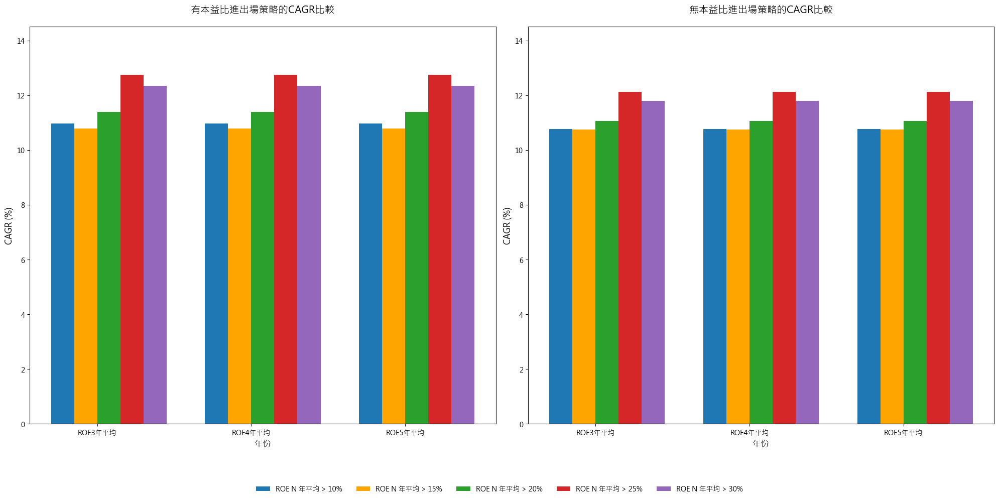

In [95]:
roe_collection_df = roe_collection.selected_stock_count_analysis()
roe_collection_df.reset_index(inplace=True)


# 建立顏色映射
colors = {
    '10': 'tab:blue',
    '15': 'orange',
    '20': 'tab:green',
    '25': 'tab:red', 
    '30': 'tab:purple'
}

# 提取年份和ROE閾值
roe_collection_df['Year'] = roe_collection_df['Strategy'].str.extract(r'roe_(\d)y')
roe_collection_df['ROE'] = roe_collection_df['Strategy'].str.extract(r'_(\d+)_')
roe_collection_df['PE'] = roe_collection_df['Strategy'].str.contains('有本益比')

# 創建子圖，設定比例為1:2，並留出下方空間給legend
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# 獲取唯一的年份值
years = sorted(roe_collection_df['Year'].unique())

# 設定長條的寬度
bar_width = 0.15

# 計算每個年份組的位置
positions = np.arange(len(years))

# 儲存所有CAGR值用於設定y軸範圍
all_cagr_values = []

# 繪製有本益比的長條圖
bars = []  # 儲存長條物件用於之後設定legend
for i, roe_bound in enumerate(['10', '15', '20', '25', '30']):
    mask_with_pe = (roe_collection_df['ROE'] == roe_bound) & (roe_collection_df['PE'])
    data_with_pe = [roe_collection_df[mask_with_pe & (roe_collection_df['Year'] == year)]['CAGR (%)'].values[0] 
                    if len(roe_collection_df[mask_with_pe & (roe_collection_df['Year'] == year)]) > 0 else 0 
                    for year in years]
    all_cagr_values.extend(data_with_pe)
    
    # 計算長條的位置
    x = positions + (i - 1.5) * bar_width

    # 繪製長條
    bar = ax1.bar(x, data_with_pe, bar_width, label=f'ROE {roe_bound}%', color=colors[roe_bound])
    bars.append(bar)

# 繪製無本益比的長條圖
for i, roe_bound in enumerate(['10', '15', '20', '25', '30']):
    mask_without_pe = (roe_collection_df['ROE'] == roe_bound) & (~roe_collection_df['PE'])
    data_without_pe = [roe_collection_df[mask_without_pe & (roe_collection_df['Year'] == year)]['CAGR (%)'].values[0] 
                      if len(roe_collection_df[mask_without_pe & (roe_collection_df['Year'] == year)]) > 0 else 0 
                      for year in years]
    all_cagr_values.extend(data_without_pe)
    
    # 計算長條的位置
    x = positions + (i - 1.5) * bar_width

    # 繪製長條
    ax2.bar(x, data_without_pe, bar_width, color=colors[roe_bound])

# # 計算y軸範圍
# y_min = min(all_cagr_values)
# y_max = max(all_cagr_values)
# y_margin = (y_max - y_min) * 0.1

# 設定兩個子圖的共同y軸範圍
ax1.set_ylim(0,14.5)
ax2.set_ylim(0,14.5)

# 設定左方子圖（有本益比）
ax1.set_xticks(positions)
ax1.set_xticklabels([f'ROE{year}年平均' for year in years])
ax1.set_title('有本益比進出場策略的CAGR比較', fontsize=14, pad=20)
ax1.set_xlabel('年份', fontsize=12)
ax1.set_ylabel('CAGR (%)', fontsize=12)

# 設定右方子圖（無本益比）
ax2.set_xticks(positions)
ax2.set_xticklabels([f'ROE{year}年平均' for year in years])
ax2.set_title('無本益比進出場策略的CAGR比較', fontsize=14, pad=20)
ax2.set_xlabel('年份', fontsize=12)
ax2.set_ylabel('CAGR (%)', fontsize=12)

# 調整版面配置
plt.tight_layout()

# 在兩圖中間下方添加legend
legend = fig.legend(bars, [f'ROE N 年平均 > {roe_bound}%' for roe_bound in ['10', '15', '20', '25', '30']], 
                   loc='center', bbox_to_anchor=(0.5, 0.02),
                   ncol=5, frameon=False)

# 調整子圖之間的間距和底部空間
plt.subplots_adjust(bottom=0.15)  # 為legend留出空間

# 顯示圖表
plt.show()